In [2]:
 ### Prepare module structure ###

import sys
sys.path.append("../")

In [10]:
### IMPORT ###

import numpy as np
import math
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import time
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

from util import *
from data import *
import models

import pickle

# auto reload imports on local changes
%load_ext autoreload
%autoreload 2
print(torch.__version__)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
1.0.0


In [4]:
### Check device ###

USE_GPU = True

dtype = torch.float32

if USE_GPU and torch.cuda.is_available():
    # TODO: Change to CPU used!
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda:0


fashion


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


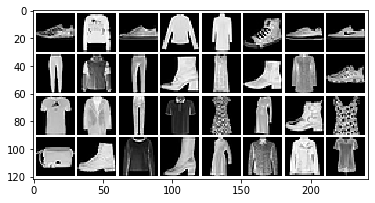

torch.Size([32, 1, 28, 28])


In [5]:
### LOAD DATA ###
dataset = 'fashion'
dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=32)

sample = next(iter(dataloader['train']))
plot_grid(sample)
print(sample.shape)
sample_ft =  torch.rfft(sample, 2, onesided=False)
sample_magnitudes = torch.sqrt(torch.sum(sample_ft**2, -1))

In [8]:
def calc_meas(x):
    m = A.shape[1]
    n = x.shape[-1] * x.shape[-2]
    assert(m <= n)
    N = x.shape[0]
    C = x.shape[1]
    compressed = (x.view(N, C, -1) @ A).view(N, C, m)
    compressed = torch.abs(compressed)

    compr_pad = nn.functional.pad(compressed, (0, n - m), mode='constant', value=0).reshape(x.shape)
    
    return compressed, compr_pad

# Function to compute test images

def test_generator(model, device, testloader):
    # put model to eval mode
    model = model.to(device=device)
    model.eval()

    # move test images to device and reduce to magnitude information in fourier space
    test_images = []
    outputs = []
    
    for data in testloader:
        z = torch.randn(*data.shape).to(device)
        data = data.to(device=device)
        _, meas_pad = calc_meas(data)
        net_input = torch.cat([z, meas_pad], dim=1)
        ouput = model(net_input)

        test_images.append(data.cpu().numpy())
        outputs.append(ouput.cpu().detach().numpy())
    
    return np.concatenate(test_images), np.concatenate(outputs)

In [6]:
# Define Gen and Disc loss
def gen_loss(disc_gen, gen_output, x, lmd):
    reconstruction = torch.mean(torch.abs(x - gen_output))
    adversarial = -torch.mean(torch.log(disc_gen))
    return  adversarial + lmd * reconstruction

def disc_loss(disc_real, disc_gen):
    return -torch.mean((torch.log(disc_real) + torch.log(1 - disc_gen)) / 2.0)

In [132]:
m = 10 # 10, 25, 50, 100, 200, 300, 500, 784

#A = (torch.randn(imsize[1] * imsize[2], m) / m).to(device)
#pickle.dump(A, open("../cache/A/A{}.p".format(m), "wb"))

A = pickle.load(open("../cache/A/A{}.p".format(m), "rb")).to(device)

print(A.shape)

torch.Size([784, 10])


In [133]:
### Create new models ###

gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=2048)
#disc = models.FCDiscriminator(imsize=imsize, h=2048)
disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=64)

Version 0.4


In [134]:
# Set training parameters

lmd = 1e3 # loss signal

g_opt = optim.Adam(gen.parameters(), lr=1e-4)
d_opt = optim.Adam(disc.parameters(), lr=1e-4)

In [135]:
# Initial loss

gen = gen.to(device)
disc = disc.to(device)
sample = sample.to(device)
_, sample_meas_pad = calc_meas(sample)

zm = torch.cat([torch.randn(*sample.shape).to(device), sample_meas_pad], dim=1)
gen_out = gen(zm)

xm = torch.cat([sample, sample_meas_pad], dim=1)
disc_output_real = disc(xm)
disc_output_generated = disc(torch.cat([gen_out, sample_meas_pad], dim=1))

g_loss = gen_loss(disc_output_generated, gen_out, sample, lmd)
d_loss = disc_loss(disc_output_real, disc_output_generated)

print("Generator loss:", g_loss.item())
print("Discriminator initial loss:", d_loss.item())

Generator loss: 369.14208984375
Discriminator initial loss: 0.6880425810813904


In [136]:
def train_model(gen, disc, g_opt, d_opt, device, loader_train, epochs=1):
    """
    Train a the conditional gan
    
    Returns: Loss history per iteration step
    """
    
    # move the model parameters to CPU/GPU
    disc = disc.to(device=device)
    gen = gen.to(device=device)
    
    # loss history
    history_g = []
    history_d = []
    history_mse = []
    
    for e in range(epochs):
        print("Starting epoch {}".format(e+1))
        
        with tqdm(total=len(loader_train.dataset)) as progress_bar:
            for t, x in enumerate(loader_train):
                
                # move x to device and reduce to magnitude information in fourier space
                x = x.to(device=device)
                _, meas_pad = calc_meas(x)

                # stack magnitudes to noise / generator input
                z = torch.randn(*x.shape).to(device)
                zm = torch.cat([z, meas_pad], dim=1)

                # calc gen output
                gen.train()
                gen_output = gen(zm)

                # calc disc output for real and generated image
                xm = torch.cat([x, meas_pad], dim=1)
                disc.train()
                disc_output_real = disc(xm)
                disc_output_generated = disc(torch.cat([gen_output, meas_pad], dim=1))

                # calculate generator loss and update generator
                g_loss = gen_loss(disc_output_generated, gen(zm), x, lmd)
                history_g.append(g_loss.item())
                g_opt.zero_grad()
                g_loss.backward(retain_graph=True)
                #torch.nn.utils.clip_grad_value_(gen.parameters(), 1e-1)
                g_opt.step()

                # calculate discriminator loss and update discriminator
                d_loss = disc_loss(disc_output_real, disc_output_generated)
                history_d.append(d_loss.item())
                d_opt.zero_grad()
                d_loss.backward()
                #torch.nn.utils.clip_grad_value_(disc.parameters(), 1e-1)
                d_opt.step()

                mse_loss = torch.mean((x - gen_output) ** 2)
                history_mse.append(mse_loss.detach().cpu().item())

                progress_bar.set_postfix(g_loss=np.mean(history_g[-100:]),
                                         d_loss=np.mean(history_d[-100:]),
                                         mse=np.mean(history_mse[-100:]))
                progress_bar.update(x.size(0))
            
        plt.plot(history_g[-10000:], label="Gen loss")
        plt.plot(history_d[-10000:], label="Disc loss")
        plt.plot(history_mse[-10000:], label="MSE")
        plt.legend()
        plt.show()
        
        test_images, test_outputs = test_generator(gen, device, dataloader['val'])
        plot_grid(np.vstack([test_images[:16],test_outputs[:16], test_images[16:32], test_outputs[16:32]]), figsize=(8,8))
        
        mse_val = np.mean((test_outputs - test_images)**2)
        print("MSE validation:", mse_val)
        
        gen_weights = gen.state_dict().copy()
        disc_weights = disc.state_dict().copy()
        #torch.save(gen_weights, "../cache/FCGenerator2048MNIST_{0:04d}_{1}_{2:.3f}.sd".format(e+1, time.strftime("%Y%m%d_%H%M%S"), mse_val))
        #torch.save(disc_weights, "../cache/ConvDiscriminator64MNIST_{0:04d}_{1}_{2:.3f}.sd".format(e+1, time.strftime("%Y%m%d_%H%M%S"), mse_val))
        #if mse_val < 0.012:
        #    break
        
    return mse_val

  0%|          | 0/60000 [00:00<?, ?it/s]

Starting epoch 1


100%|██████████| 60000/60000 [00:34<00:00, 1718.89it/s, d_loss=0.0153, g_loss=139, mse=0.0589] 


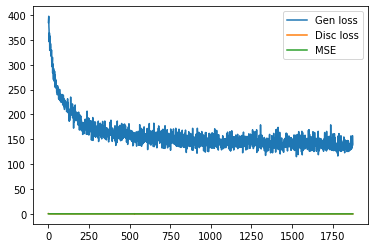

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


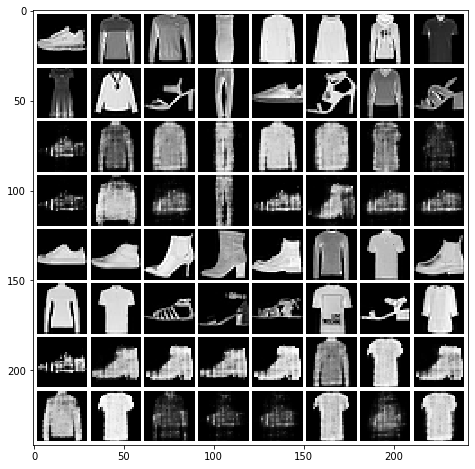

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.05854277
Starting epoch 2


100%|██████████| 60000/60000 [00:35<00:00, 1706.48it/s, d_loss=0.036, g_loss=128, mse=0.0522] 


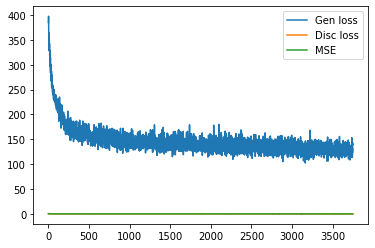

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


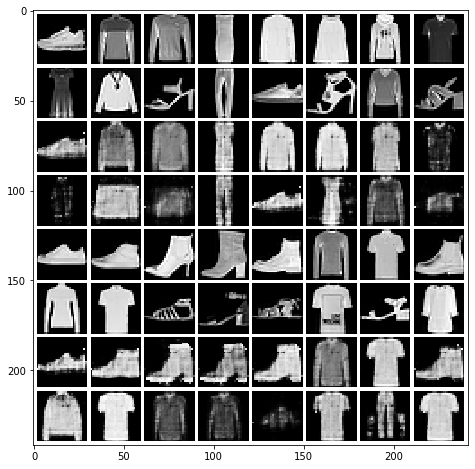

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.050489023
Starting epoch 3


100%|██████████| 60000/60000 [00:34<00:00, 1718.68it/s, d_loss=0.026, g_loss=120, mse=0.0475] 


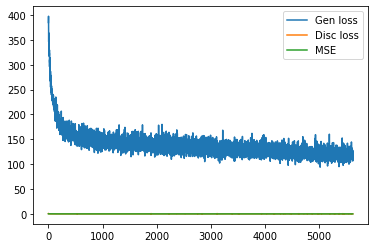

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


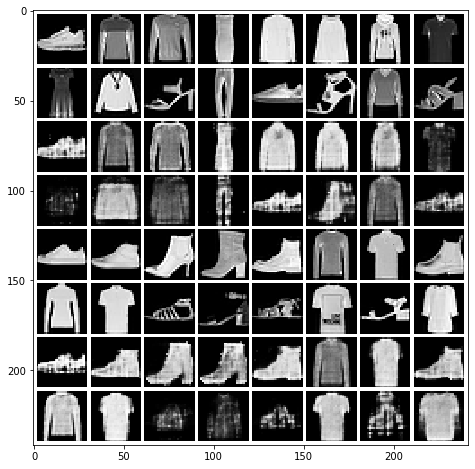

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.045323078
Starting epoch 4


100%|██████████| 60000/60000 [00:34<00:00, 1766.22it/s, d_loss=0.0426, g_loss=117, mse=0.0452]


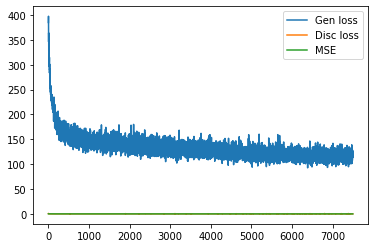

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


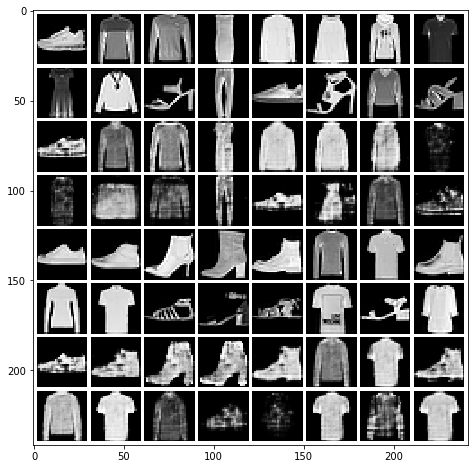

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.042857196
Starting epoch 5


100%|██████████| 60000/60000 [00:34<00:00, 1602.84it/s, d_loss=0.0584, g_loss=111, mse=0.0416]


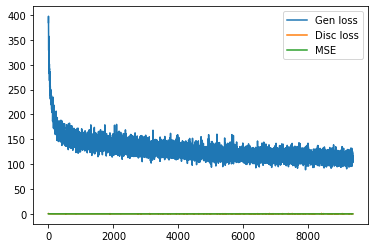

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


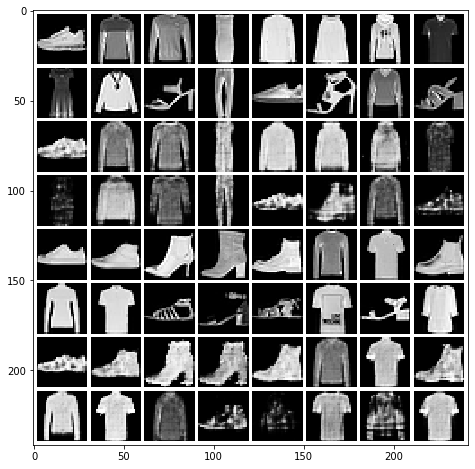

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.039641783
Starting epoch 6


100%|██████████| 60000/60000 [00:35<00:00, 1707.36it/s, d_loss=0.0609, g_loss=109, mse=0.0411]


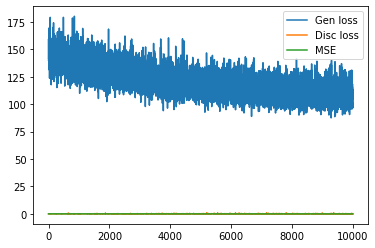

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


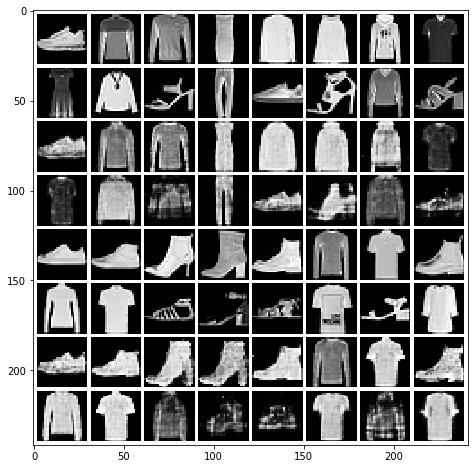

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.039123133
Starting epoch 7


100%|██████████| 60000/60000 [00:34<00:00, 1721.01it/s, d_loss=0.0689, g_loss=107, mse=0.0394]


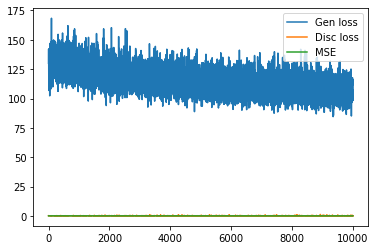

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


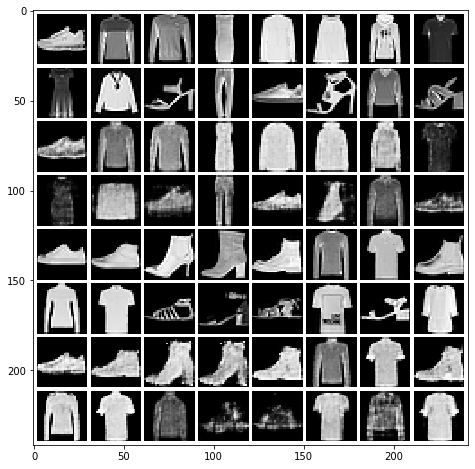

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.036618926
Starting epoch 8


100%|██████████| 60000/60000 [00:35<00:00, 1708.42it/s, d_loss=0.0435, g_loss=106, mse=0.0388]


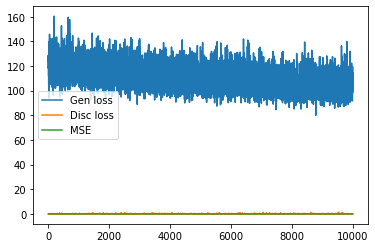

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


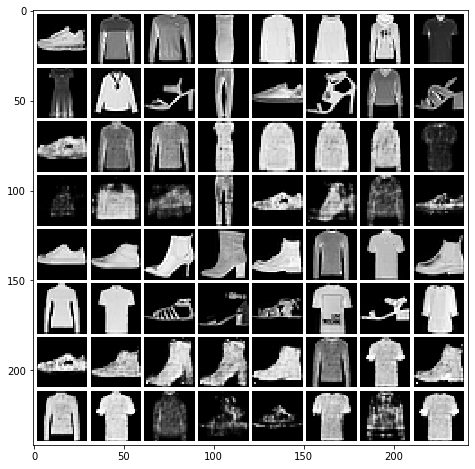

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.036686413
Starting epoch 9


100%|██████████| 60000/60000 [00:35<00:00, 1706.81it/s, d_loss=0.0814, g_loss=104, mse=0.0371]


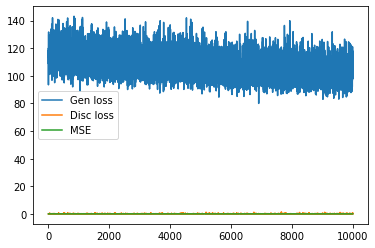

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


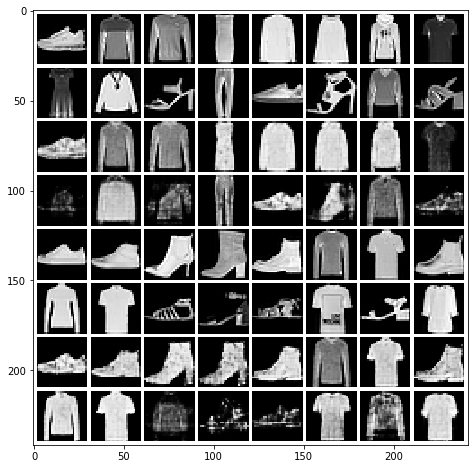

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.03585615
Starting epoch 10


100%|██████████| 60000/60000 [00:35<00:00, 1703.67it/s, d_loss=0.0899, g_loss=100, mse=0.0355] 


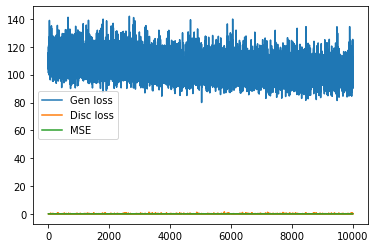

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


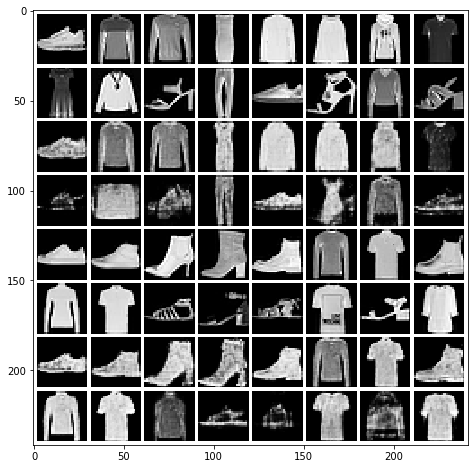

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.034174938
Starting epoch 11


100%|██████████| 60000/60000 [00:35<00:00, 1710.39it/s, d_loss=0.0549, g_loss=100, mse=0.0356] 


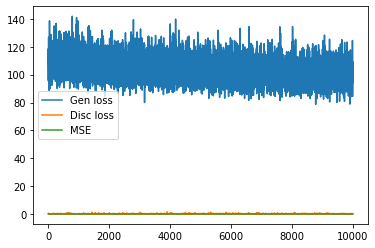

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


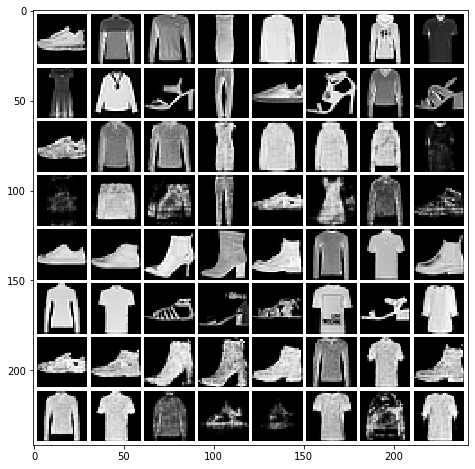

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.033841938
Starting epoch 12


100%|██████████| 60000/60000 [00:35<00:00, 1702.67it/s, d_loss=0.0669, g_loss=98.7, mse=0.0347]


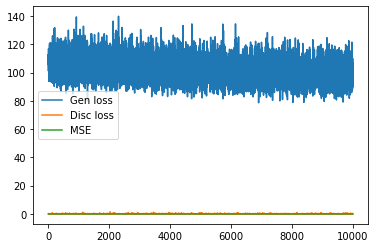

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


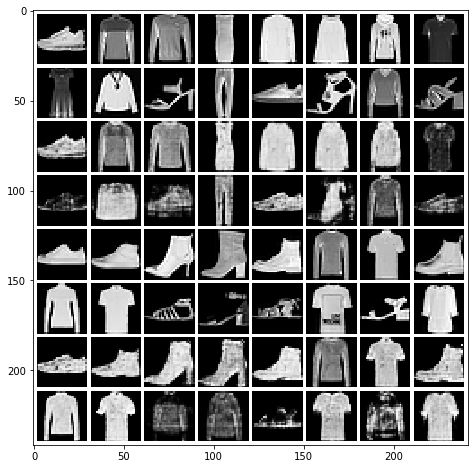

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.033391725
Starting epoch 13


100%|██████████| 60000/60000 [00:35<00:00, 1714.14it/s, d_loss=0.0701, g_loss=97.2, mse=0.034] 


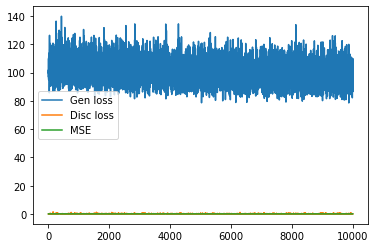

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


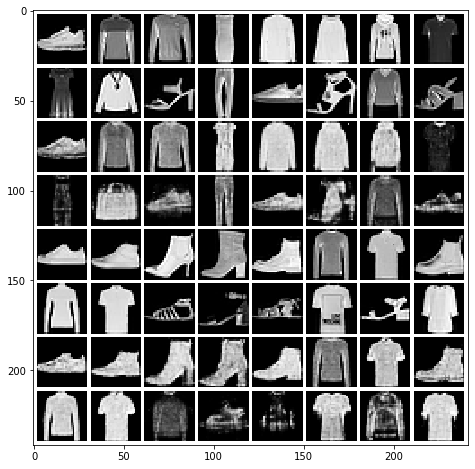

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.032756373
Starting epoch 14


100%|██████████| 60000/60000 [00:35<00:00, 1711.00it/s, d_loss=0.0676, g_loss=97.2, mse=0.0339]


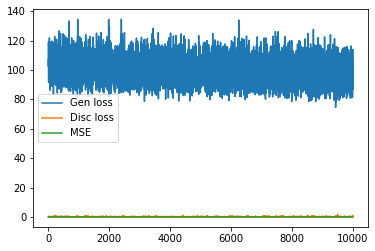

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


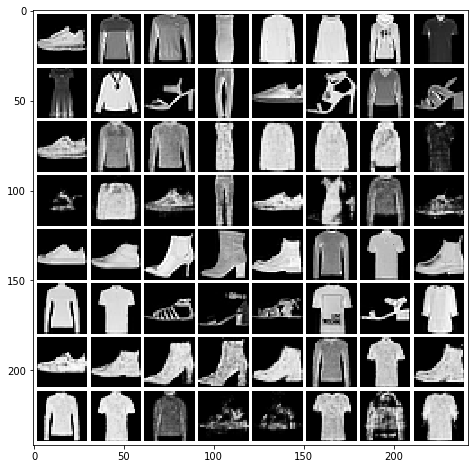

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.03278803
Starting epoch 15


100%|██████████| 60000/60000 [00:35<00:00, 1695.94it/s, d_loss=0.0577, g_loss=95.2, mse=0.0325]


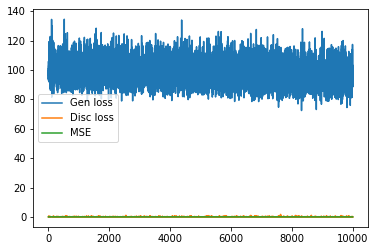

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


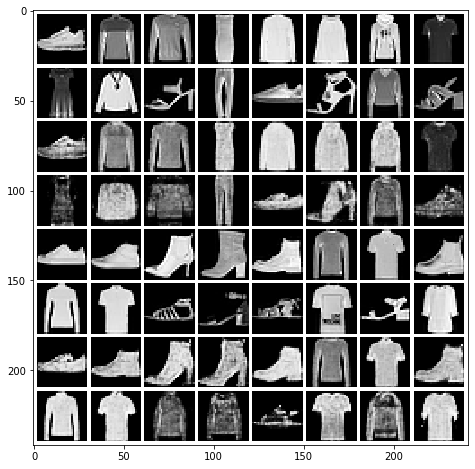

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.03221188
Starting epoch 16


100%|██████████| 60000/60000 [00:35<00:00, 1696.50it/s, d_loss=0.0396, g_loss=94.8, mse=0.0324]


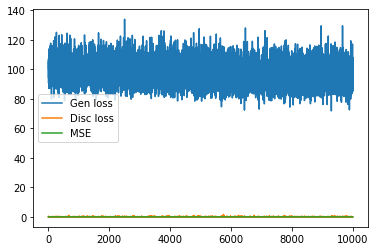

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


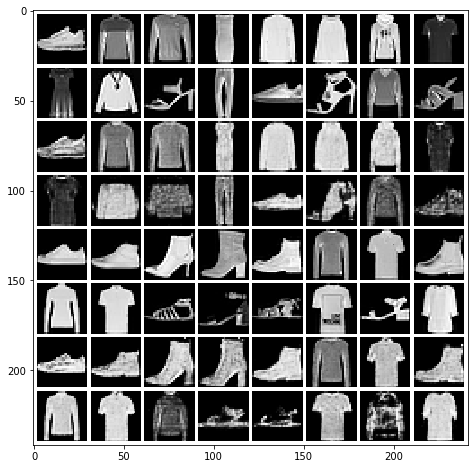

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.031571697
Starting epoch 17


100%|██████████| 60000/60000 [00:35<00:00, 1708.57it/s, d_loss=0.0784, g_loss=93.5, mse=0.0317]


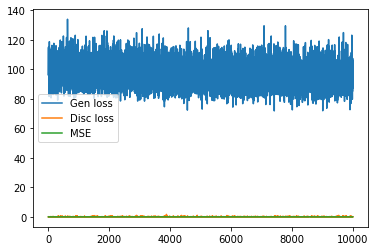

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


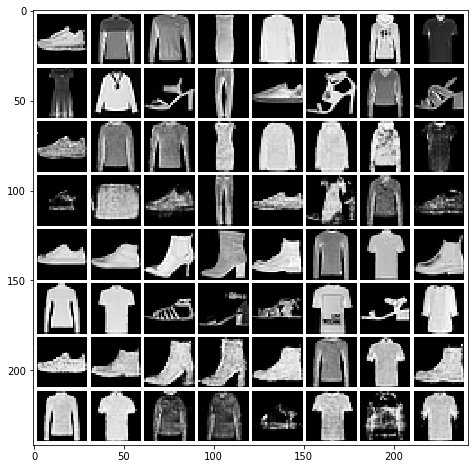

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.031331316
Starting epoch 18


100%|██████████| 60000/60000 [00:35<00:00, 1704.00it/s, d_loss=0.0714, g_loss=94.3, mse=0.032] 


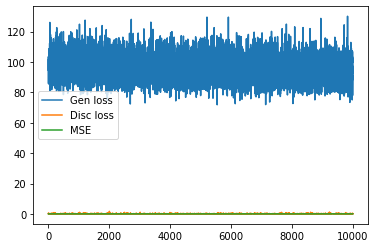

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


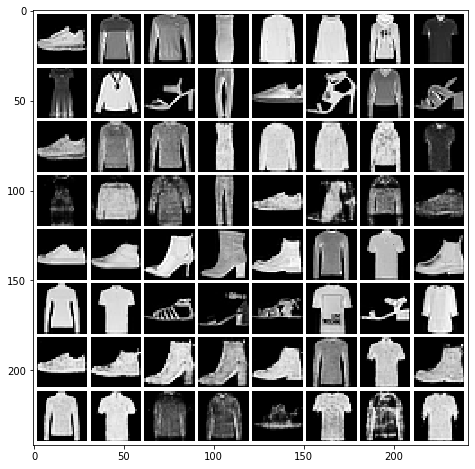

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.030883687
Starting epoch 19


100%|██████████| 60000/60000 [00:35<00:00, 1699.08it/s, d_loss=0.0497, g_loss=93.6, mse=0.0317]


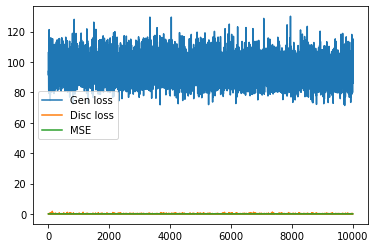

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


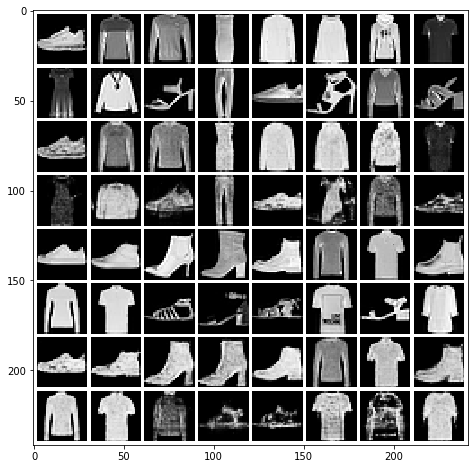

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.030560004
Starting epoch 20


100%|██████████| 60000/60000 [00:34<00:00, 1717.91it/s, d_loss=0.0893, g_loss=92.8, mse=0.0312]


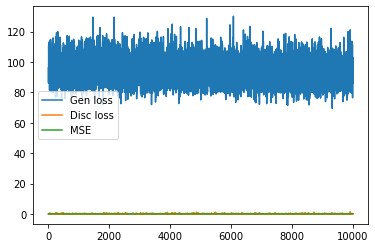

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


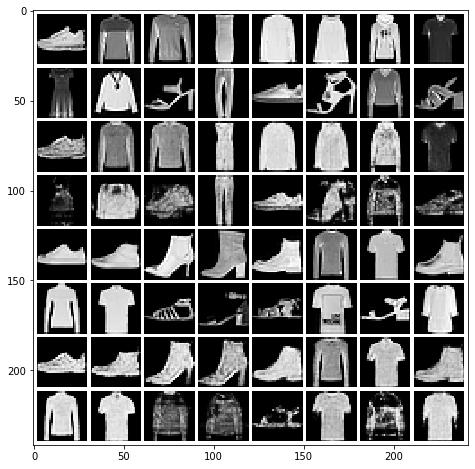

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.030168813
Starting epoch 21


100%|██████████| 60000/60000 [00:35<00:00, 1656.49it/s, d_loss=0.0578, g_loss=92.2, mse=0.031] 


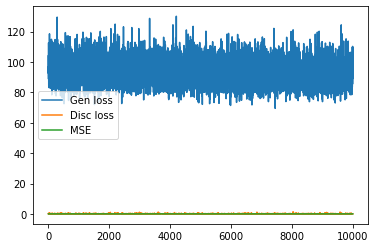

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


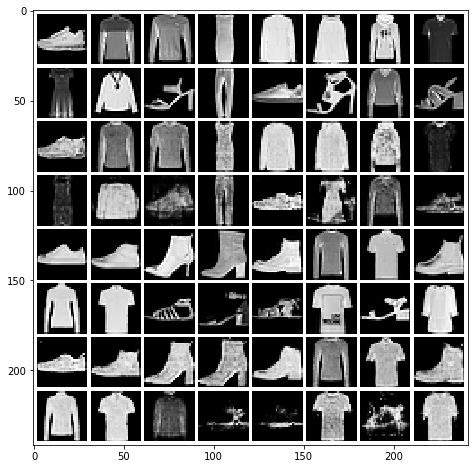

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.030240327
Starting epoch 22


100%|██████████| 60000/60000 [00:35<00:00, 1673.16it/s, d_loss=0.0498, g_loss=91, mse=0.0302]  


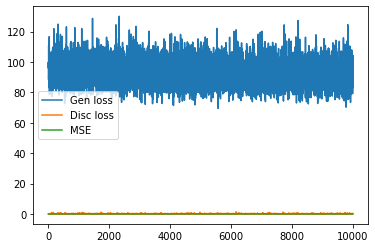

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


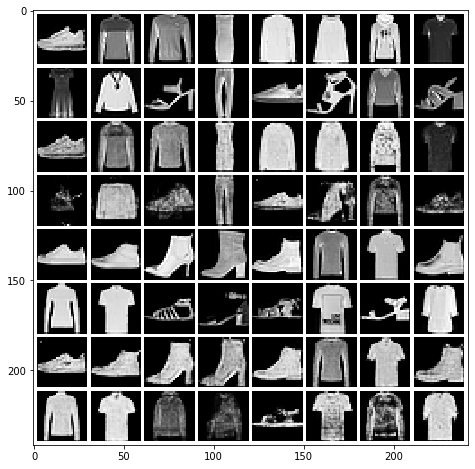

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02943809
Starting epoch 23


100%|██████████| 60000/60000 [00:34<00:00, 1719.16it/s, d_loss=0.0515, g_loss=90.4, mse=0.03]  


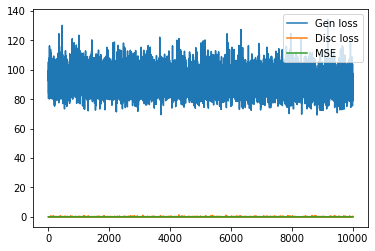

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


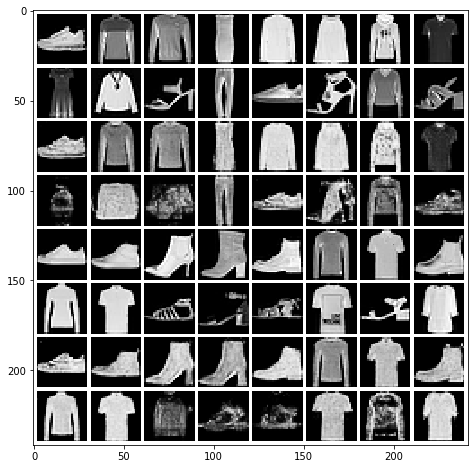

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.029151581
Starting epoch 24


100%|██████████| 60000/60000 [00:34<00:00, 1724.48it/s, d_loss=0.0859, g_loss=90.4, mse=0.03]  


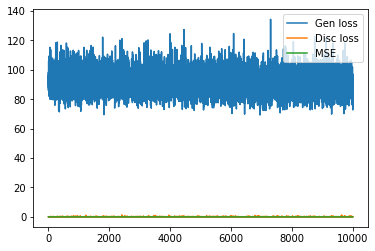

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


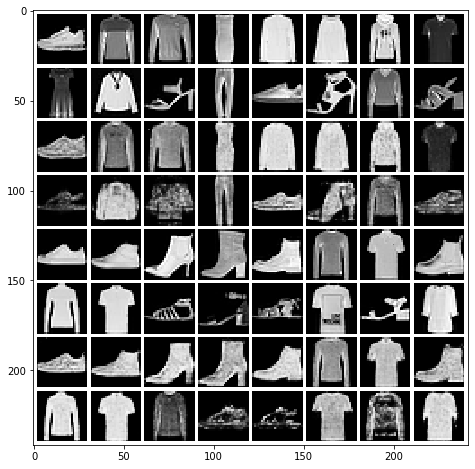

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.029445497
Starting epoch 25


100%|██████████| 60000/60000 [00:35<00:00, 1694.28it/s, d_loss=0.0578, g_loss=89.6, mse=0.0294]


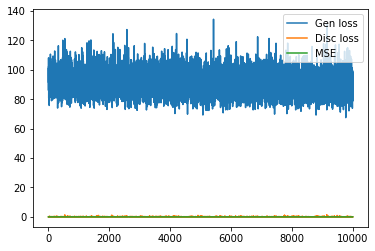

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


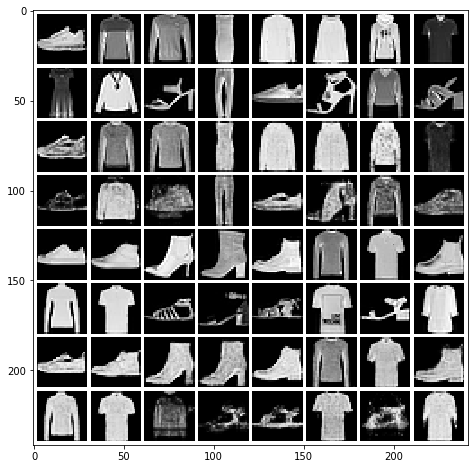

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.029775914
Starting epoch 26


100%|██████████| 60000/60000 [00:34<00:00, 1719.66it/s, d_loss=0.0542, g_loss=88.7, mse=0.0291]


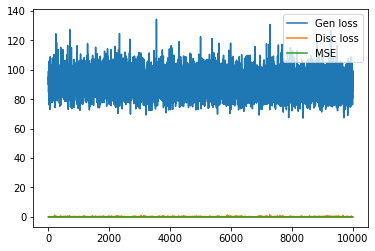

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


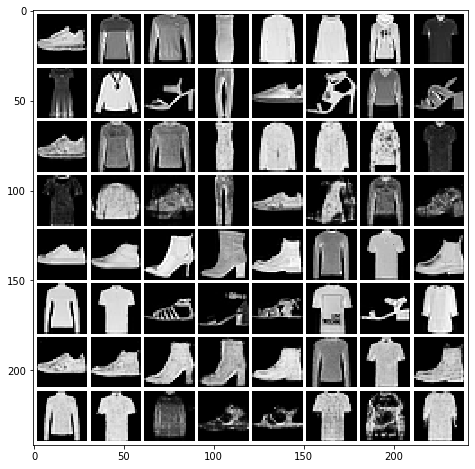

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.028728439
Starting epoch 27


100%|██████████| 60000/60000 [00:35<00:00, 1706.80it/s, d_loss=0.0638, g_loss=88.6, mse=0.0286]


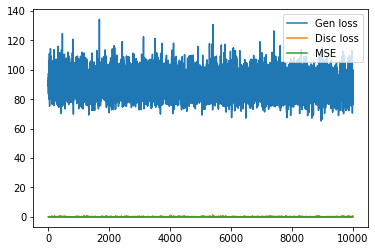

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


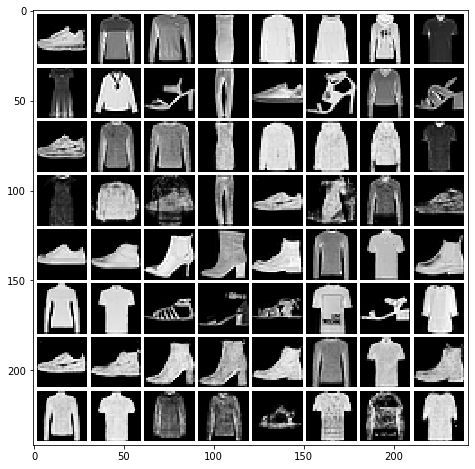

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.028305385
Starting epoch 28


100%|██████████| 60000/60000 [00:35<00:00, 1699.25it/s, d_loss=0.0639, g_loss=88.9, mse=0.0288]


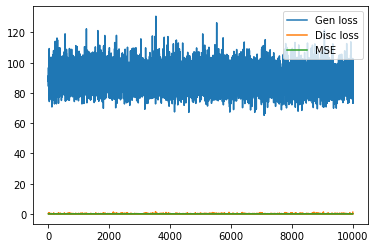

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


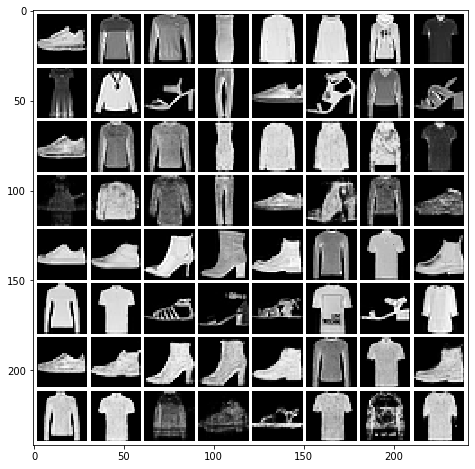

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02790719
Starting epoch 29


100%|██████████| 60000/60000 [00:35<00:00, 1710.14it/s, d_loss=0.0454, g_loss=88.5, mse=0.0286]


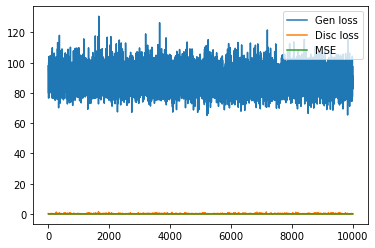

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


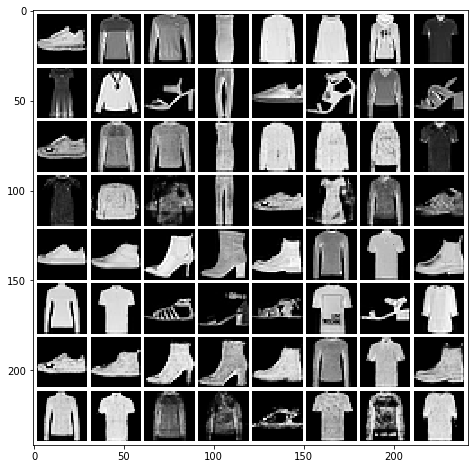

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.028404197
Starting epoch 30


100%|██████████| 60000/60000 [00:35<00:00, 1708.68it/s, d_loss=0.0454, g_loss=88.2, mse=0.0287]


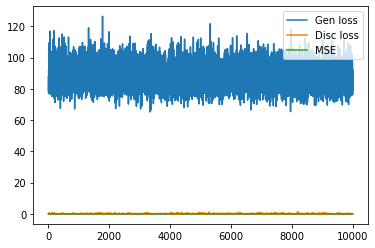

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


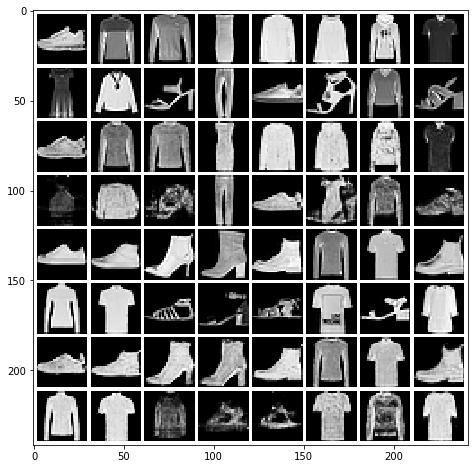

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.028090037
Starting epoch 31


100%|██████████| 60000/60000 [00:34<00:00, 1739.58it/s, d_loss=0.127, g_loss=85.8, mse=0.0274] 


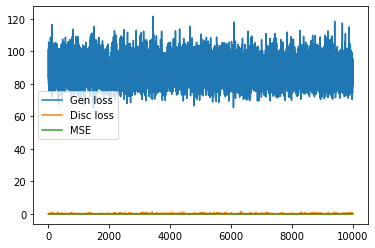

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


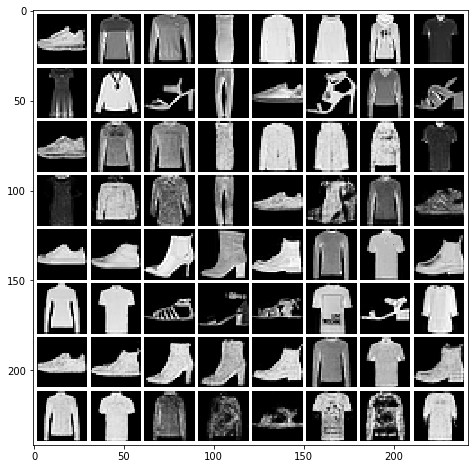

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.027331077
Starting epoch 32


100%|██████████| 60000/60000 [00:34<00:00, 1719.19it/s, d_loss=0.038, g_loss=86.3, mse=0.0272] 


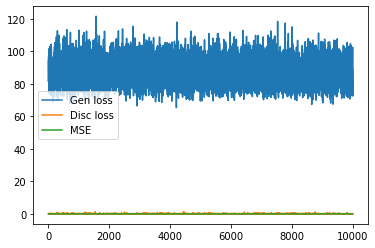

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


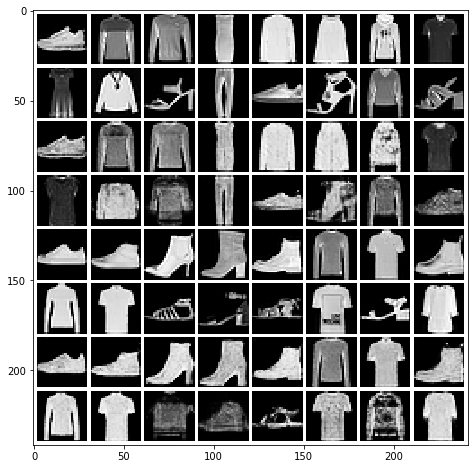

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.027514378
Starting epoch 33


100%|██████████| 60000/60000 [00:35<00:00, 1693.66it/s, d_loss=0.0557, g_loss=87, mse=0.028]   


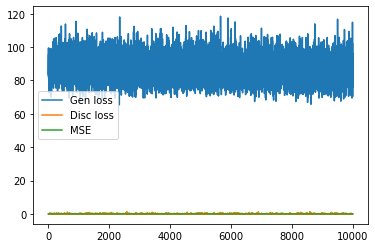

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


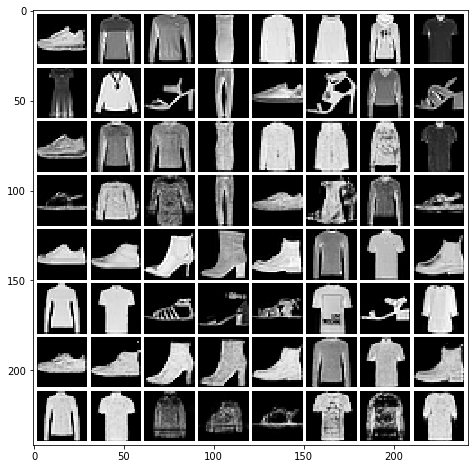

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.027339866
Starting epoch 34


100%|██████████| 60000/60000 [00:34<00:00, 1725.57it/s, d_loss=0.0397, g_loss=86, mse=0.0275]  


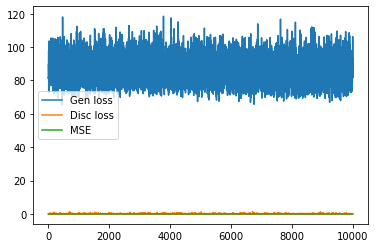

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


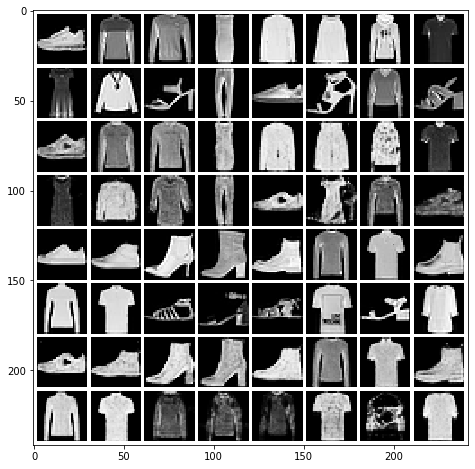

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.028309267
Starting epoch 35


100%|██████████| 60000/60000 [00:35<00:00, 1690.42it/s, d_loss=0.0683, g_loss=84.5, mse=0.0265]


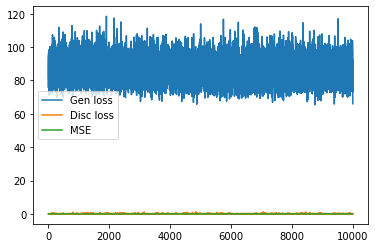

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


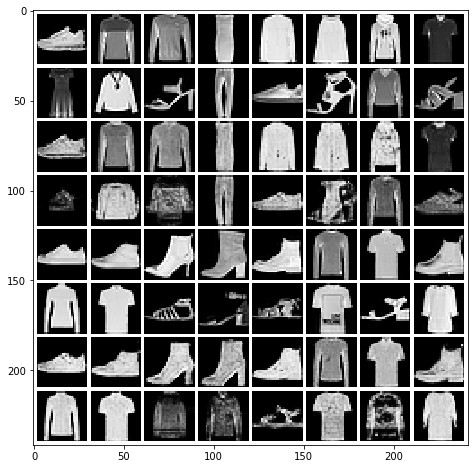

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.027500529
Starting epoch 36


100%|██████████| 60000/60000 [00:35<00:00, 1696.65it/s, d_loss=0.0837, g_loss=84.4, mse=0.0266]


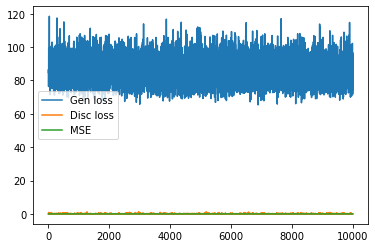

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


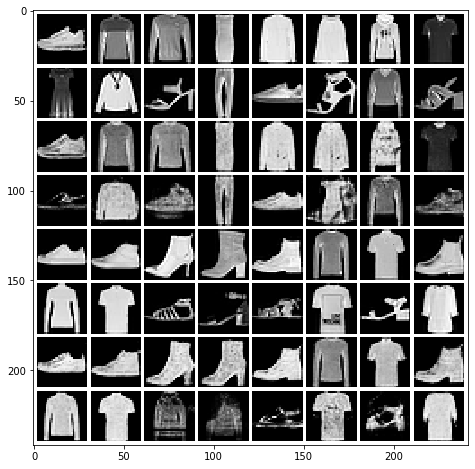

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.027024755
Starting epoch 37


100%|██████████| 60000/60000 [00:35<00:00, 1707.40it/s, d_loss=0.101, g_loss=82.1, mse=0.0257] 


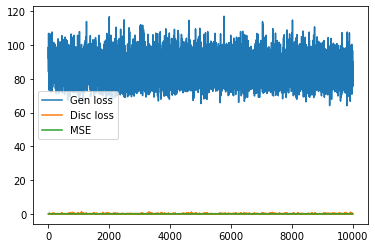

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


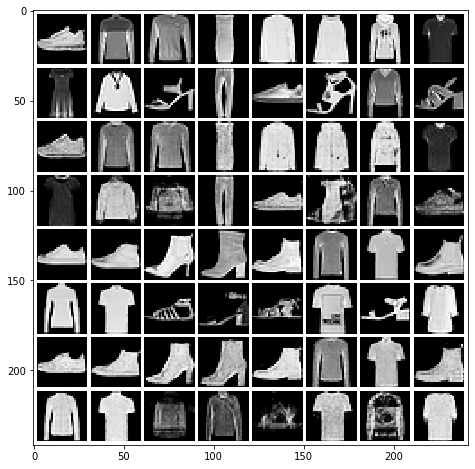

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026551945
Starting epoch 38


100%|██████████| 60000/60000 [00:36<00:00, 1665.62it/s, d_loss=0.0502, g_loss=84.6, mse=0.0266]


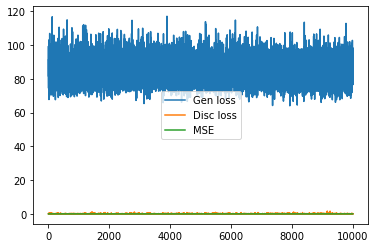

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


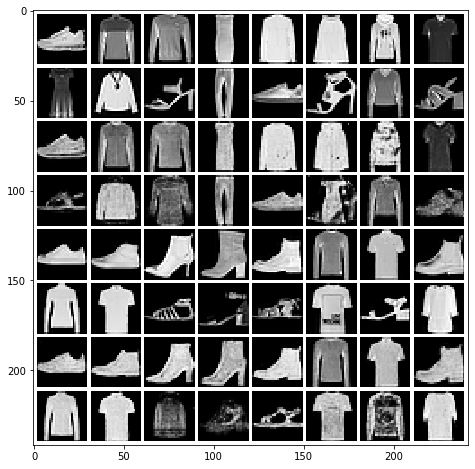

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026473125
Starting epoch 39


100%|██████████| 60000/60000 [00:35<00:00, 1788.02it/s, d_loss=0.0469, g_loss=85.8, mse=0.027] 


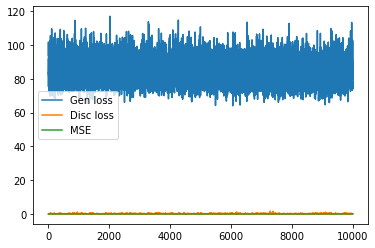

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


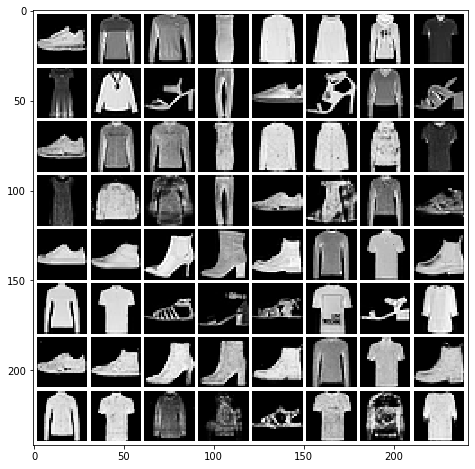

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026904287
Starting epoch 40


100%|██████████| 60000/60000 [00:34<00:00, 1723.97it/s, d_loss=0.0504, g_loss=83.6, mse=0.0261]


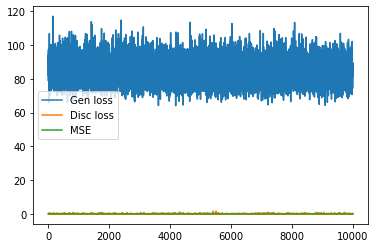

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


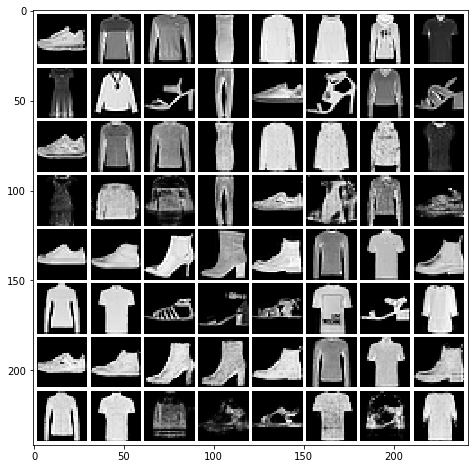

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026991367
Starting epoch 41


100%|██████████| 60000/60000 [00:34<00:00, 1715.41it/s, d_loss=0.0638, g_loss=83.5, mse=0.0261]


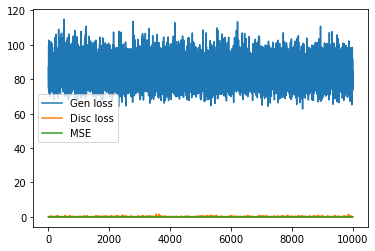

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


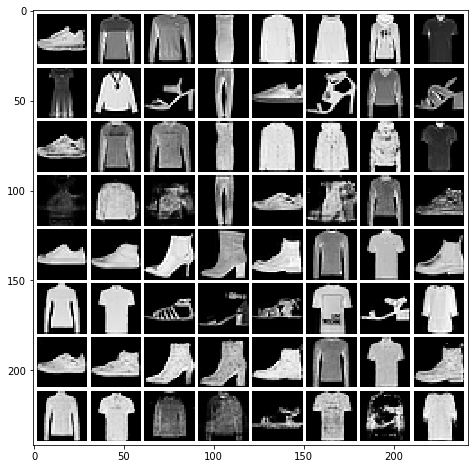

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026647588
Starting epoch 42


100%|██████████| 60000/60000 [00:35<00:00, 1704.24it/s, d_loss=0.0636, g_loss=82.6, mse=0.0254]


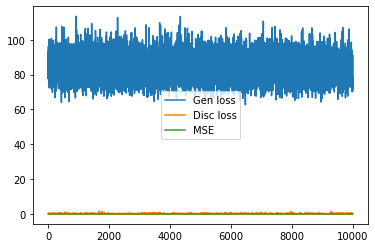

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


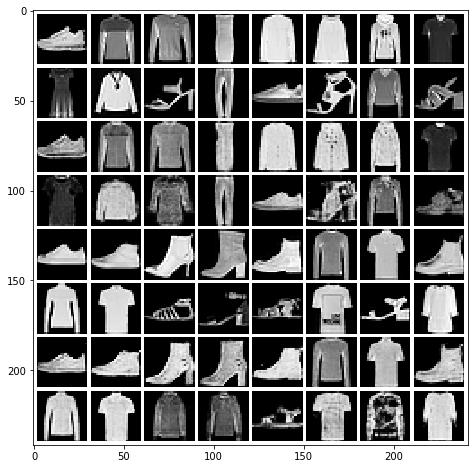

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026633533
Starting epoch 43


100%|██████████| 60000/60000 [00:35<00:00, 1692.51it/s, d_loss=0.0771, g_loss=82.7, mse=0.0257]


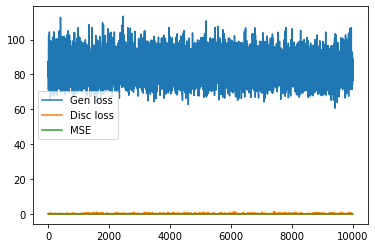

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


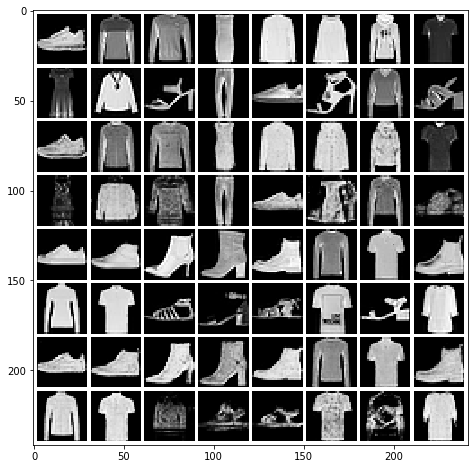

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026520312
Starting epoch 44


100%|██████████| 60000/60000 [00:35<00:00, 1779.28it/s, d_loss=0.0564, g_loss=82.6, mse=0.0256]


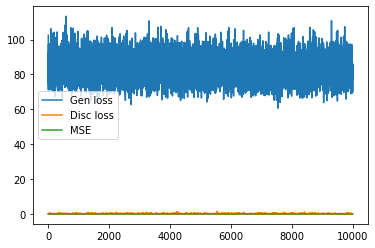

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


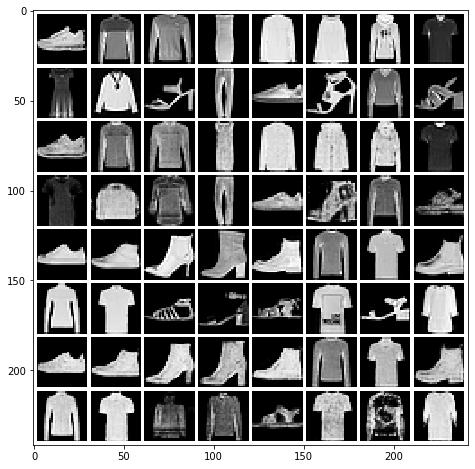

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02596363
Starting epoch 45


100%|██████████| 60000/60000 [00:34<00:00, 1750.77it/s, d_loss=0.0616, g_loss=81.8, mse=0.0251]


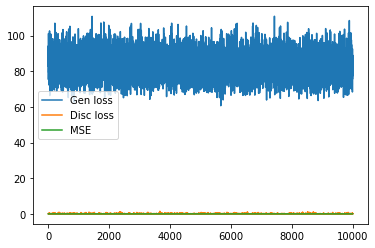

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


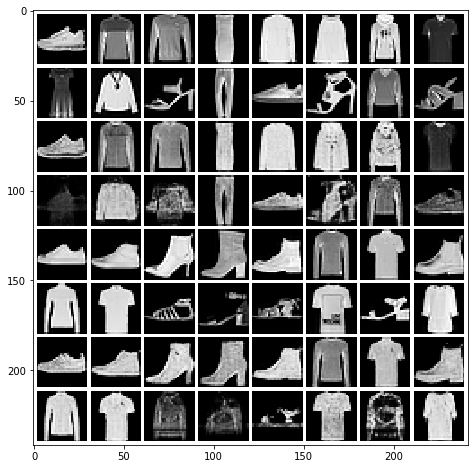

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026374612
Starting epoch 46


100%|██████████| 60000/60000 [00:35<00:00, 1675.17it/s, d_loss=0.0532, g_loss=80.8, mse=0.0247]


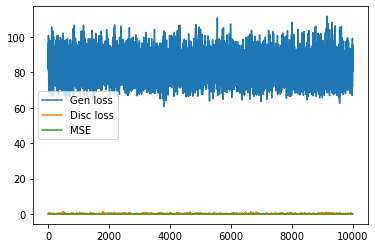

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


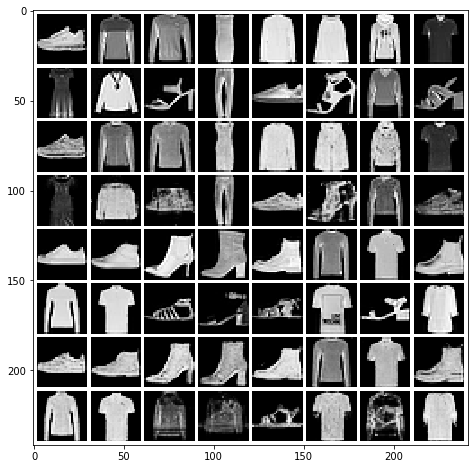

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026125008
Starting epoch 47


100%|██████████| 60000/60000 [00:35<00:00, 1674.73it/s, d_loss=0.0671, g_loss=81.8, mse=0.0248]


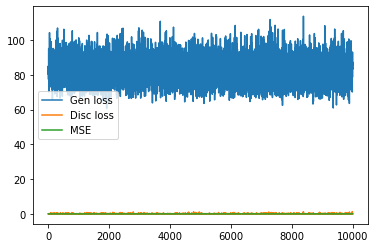

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


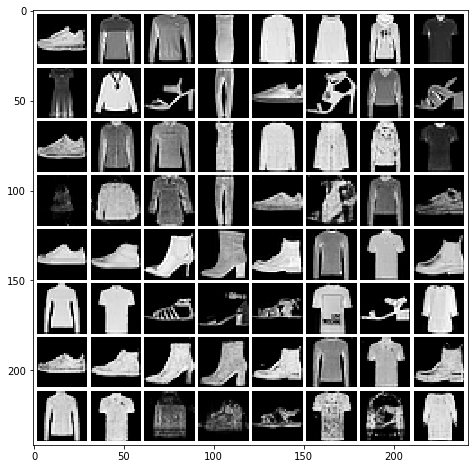

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025685815
Starting epoch 48


100%|██████████| 60000/60000 [00:34<00:00, 1727.15it/s, d_loss=0.0437, g_loss=81, mse=0.0245]  


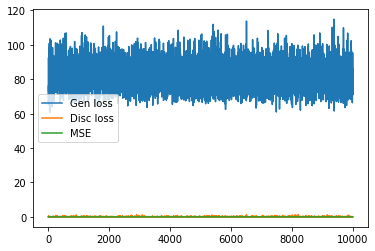

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


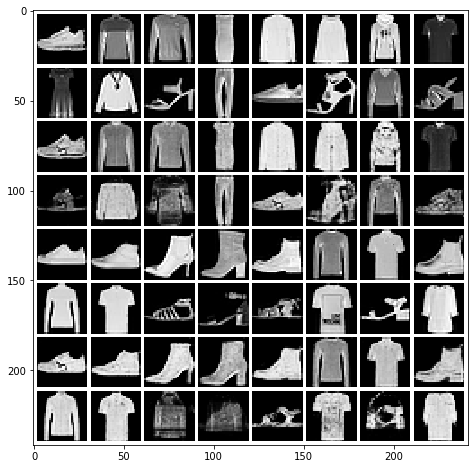

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026510034
Starting epoch 49


100%|██████████| 60000/60000 [00:35<00:00, 1702.59it/s, d_loss=0.0592, g_loss=81.8, mse=0.025] 


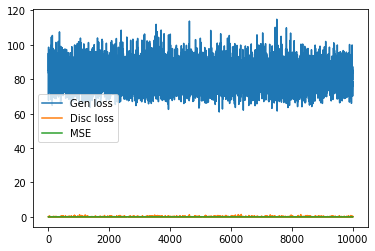

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


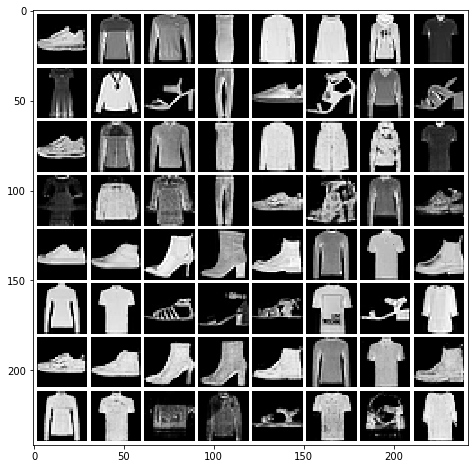

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026220126
Starting epoch 50


100%|██████████| 60000/60000 [00:34<00:00, 1725.06it/s, d_loss=0.0616, g_loss=80.8, mse=0.0244]


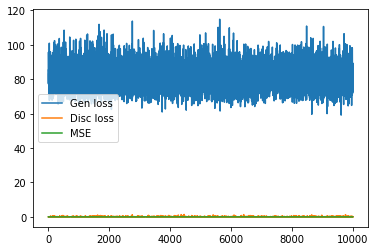

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


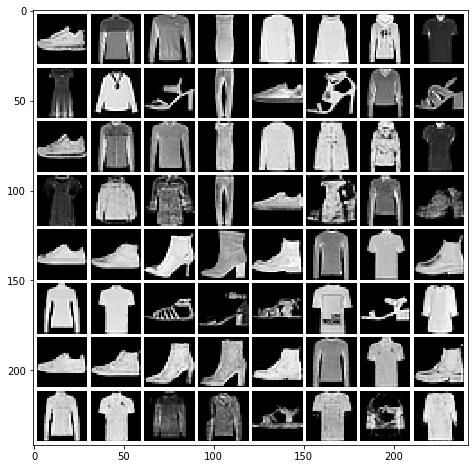

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02577885
Starting epoch 51


100%|██████████| 60000/60000 [00:35<00:00, 1695.34it/s, d_loss=0.0484, g_loss=82.2, mse=0.0251]


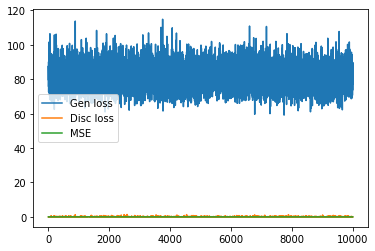

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


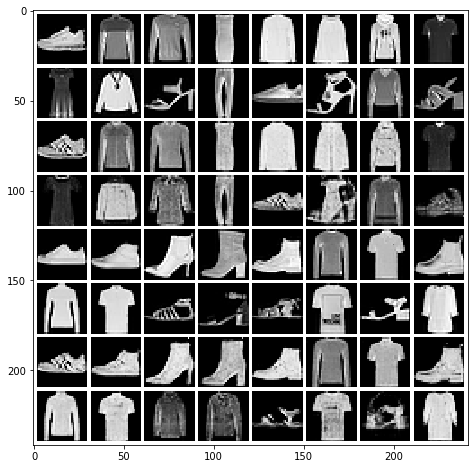

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02584035
Starting epoch 52


100%|██████████| 60000/60000 [00:35<00:00, 1742.29it/s, d_loss=0.0563, g_loss=79.8, mse=0.024] 


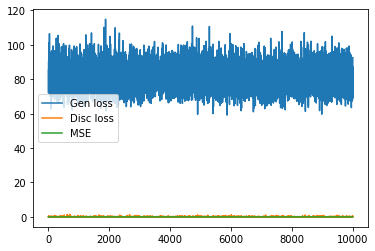

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


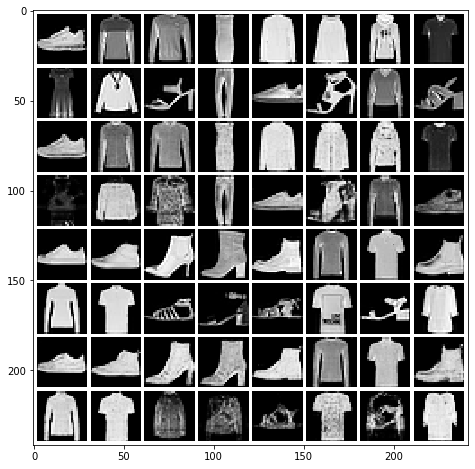

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.026060017
Starting epoch 53


100%|██████████| 60000/60000 [00:35<00:00, 1692.14it/s, d_loss=0.0504, g_loss=80.1, mse=0.0243]


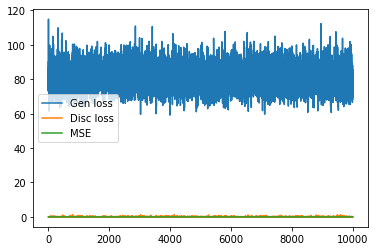

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


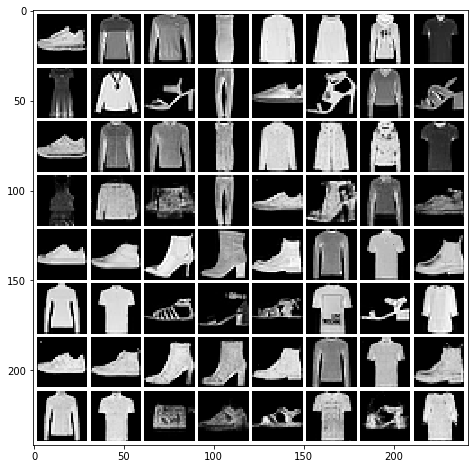

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025186121
Starting epoch 54


100%|██████████| 60000/60000 [00:35<00:00, 1699.51it/s, d_loss=0.0422, g_loss=80.5, mse=0.0245]


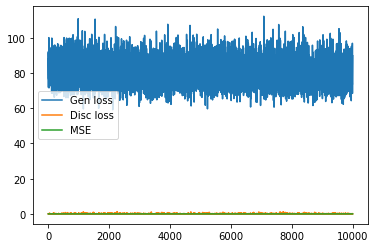

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


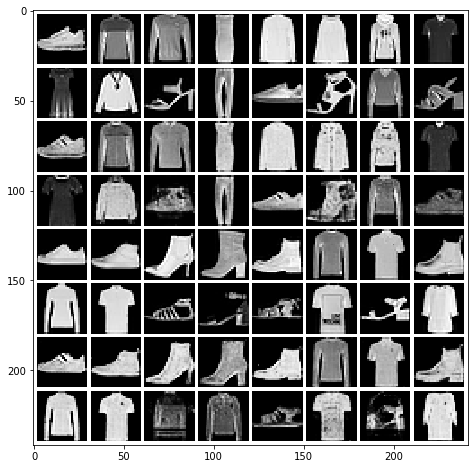

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.0259162
Starting epoch 55


100%|██████████| 60000/60000 [00:35<00:00, 1702.09it/s, d_loss=0.0661, g_loss=79.3, mse=0.0238]


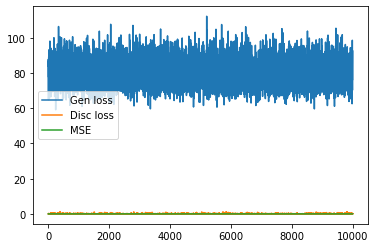

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


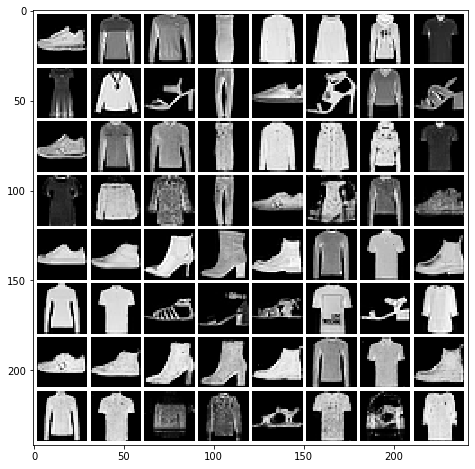

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025643395
Starting epoch 56


100%|██████████| 60000/60000 [00:34<00:00, 1727.20it/s, d_loss=0.0596, g_loss=81.6, mse=0.0248]


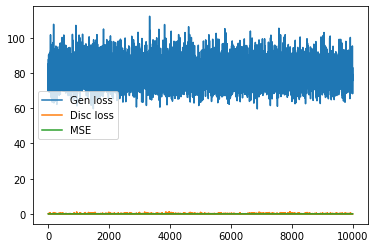

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


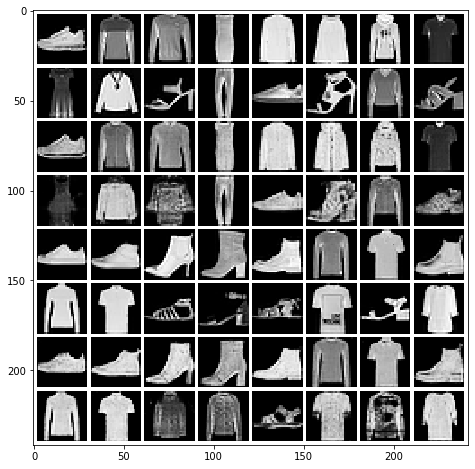

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025673484
Starting epoch 57


100%|██████████| 60000/60000 [00:34<00:00, 1741.44it/s, d_loss=0.0802, g_loss=78.7, mse=0.0234]


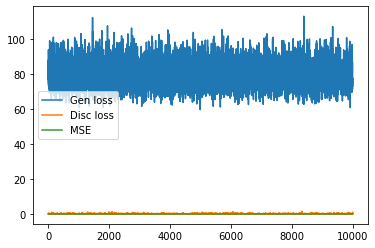

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


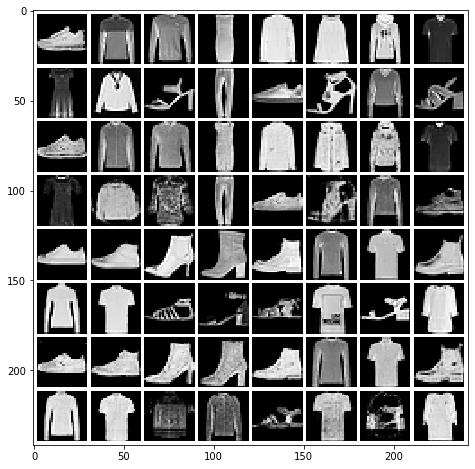

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025425948
Starting epoch 58


100%|██████████| 60000/60000 [00:34<00:00, 1724.05it/s, d_loss=0.0848, g_loss=79.1, mse=0.0236]


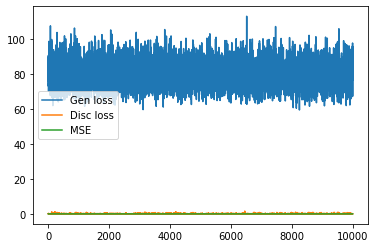

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


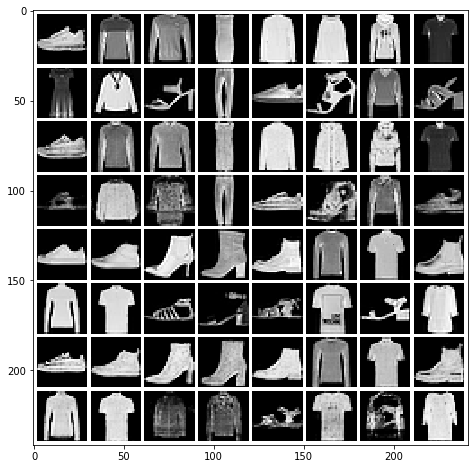

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02593775
Starting epoch 59


100%|██████████| 60000/60000 [00:34<00:00, 1718.57it/s, d_loss=0.0438, g_loss=79.2, mse=0.0237]


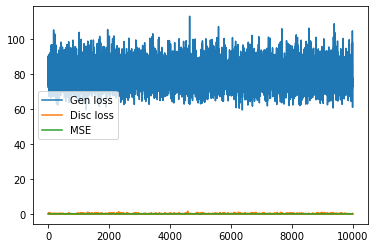

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


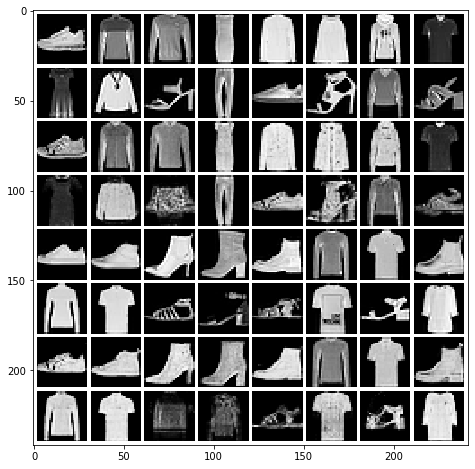

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025441008
Starting epoch 60


100%|██████████| 60000/60000 [00:35<00:00, 1705.57it/s, d_loss=0.0903, g_loss=79, mse=0.0235]  


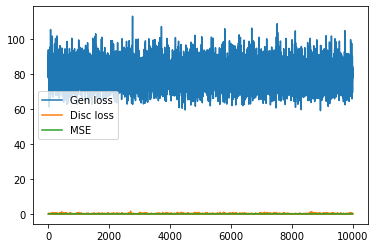

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


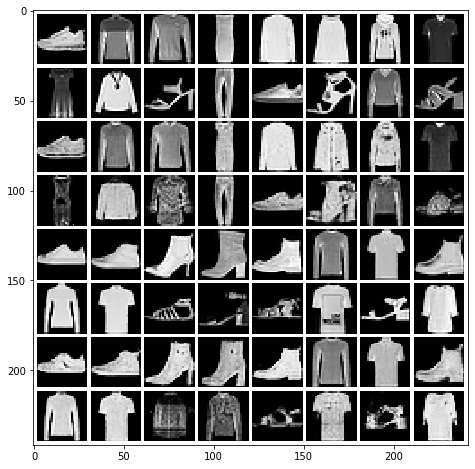

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025699632
Starting epoch 61


100%|██████████| 60000/60000 [00:34<00:00, 1751.21it/s, d_loss=0.0765, g_loss=79.4, mse=0.0238]


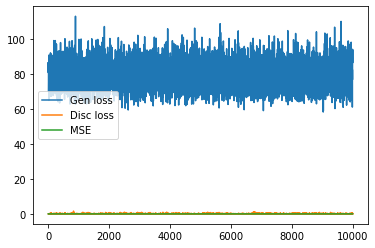

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


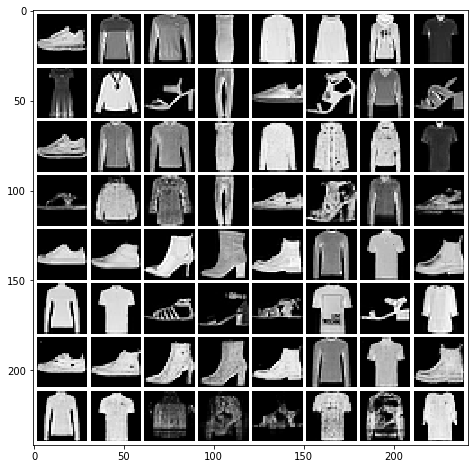

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025901524
Starting epoch 62


100%|██████████| 60000/60000 [00:35<00:00, 1683.84it/s, d_loss=0.0575, g_loss=79.7, mse=0.0237]


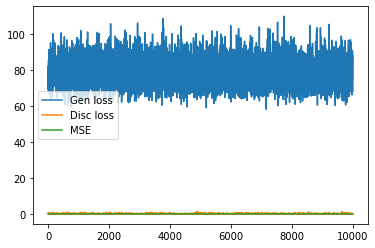

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


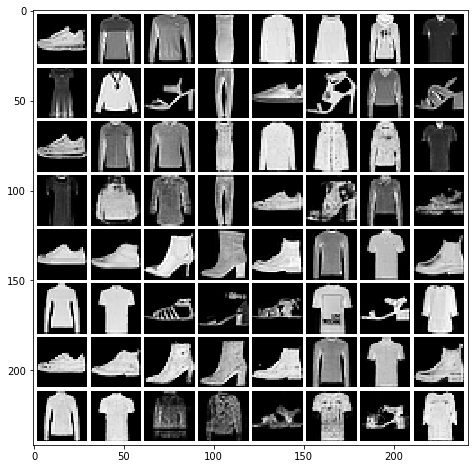

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025581686
Starting epoch 63


100%|██████████| 60000/60000 [00:34<00:00, 1724.72it/s, d_loss=0.0679, g_loss=78.4, mse=0.0234]


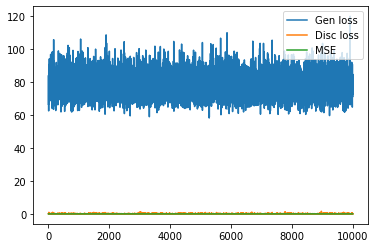

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


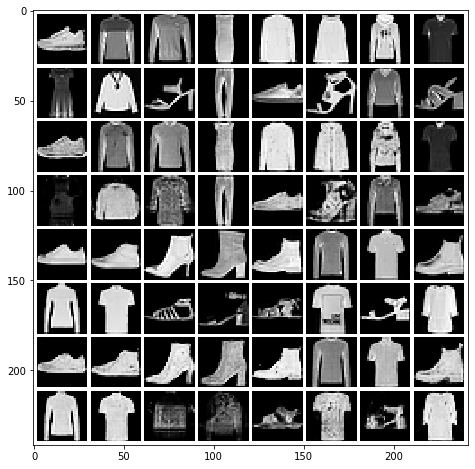

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02542434
Starting epoch 64


100%|██████████| 60000/60000 [00:34<00:00, 1722.40it/s, d_loss=0.0625, g_loss=78.4, mse=0.0232]


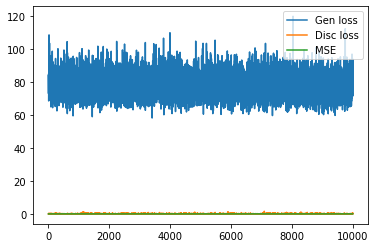

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


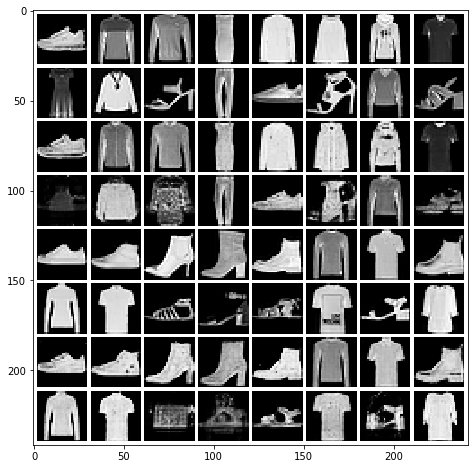

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02555563
Starting epoch 65


100%|██████████| 60000/60000 [00:34<00:00, 1743.65it/s, d_loss=0.092, g_loss=78.3, mse=0.0232] 


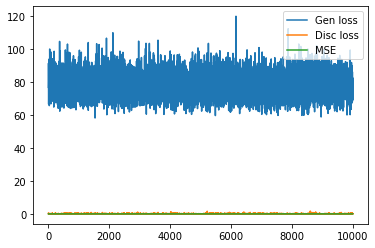

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


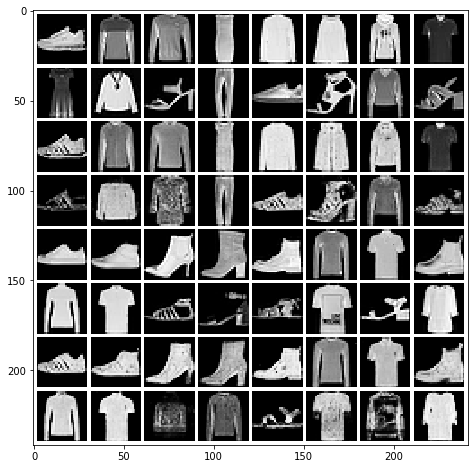

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025960496
Starting epoch 66


100%|██████████| 60000/60000 [00:34<00:00, 1741.38it/s, d_loss=0.0433, g_loss=75.9, mse=0.0222]


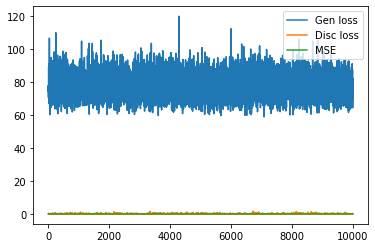

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


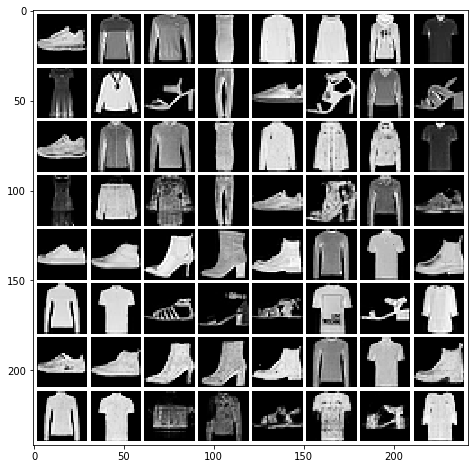

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025105122
Starting epoch 67


100%|██████████| 60000/60000 [00:34<00:00, 1728.48it/s, d_loss=0.0779, g_loss=77.6, mse=0.0227]


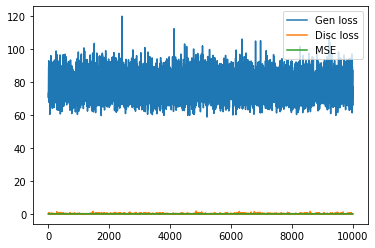

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


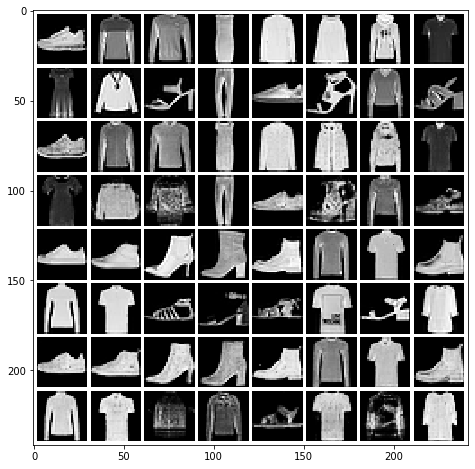

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024499666
Starting epoch 68


100%|██████████| 60000/60000 [00:34<00:00, 1736.63it/s, d_loss=0.0796, g_loss=76.7, mse=0.0224]


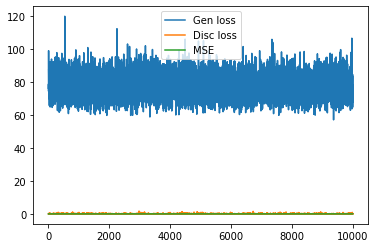

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


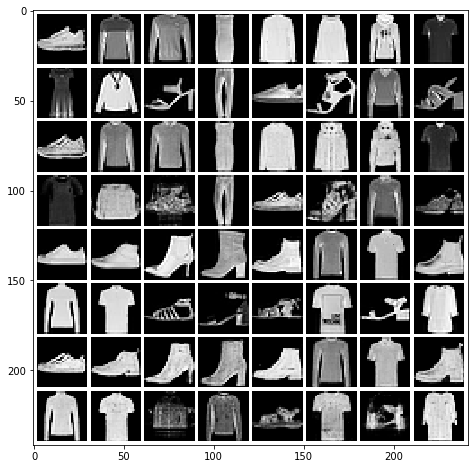

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025090277
Starting epoch 69


100%|██████████| 60000/60000 [00:34<00:00, 1723.87it/s, d_loss=0.0672, g_loss=76.2, mse=0.0222]


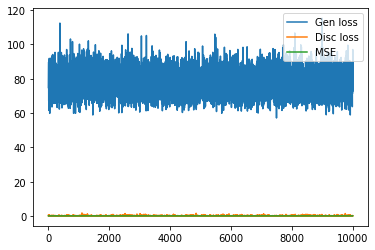

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


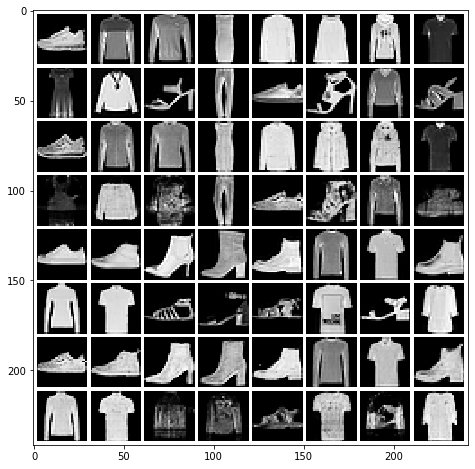

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025343645
Starting epoch 70


100%|██████████| 60000/60000 [00:35<00:00, 1707.04it/s, d_loss=0.0712, g_loss=77, mse=0.0226]  


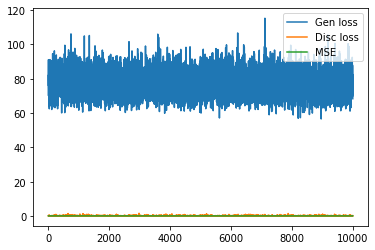

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


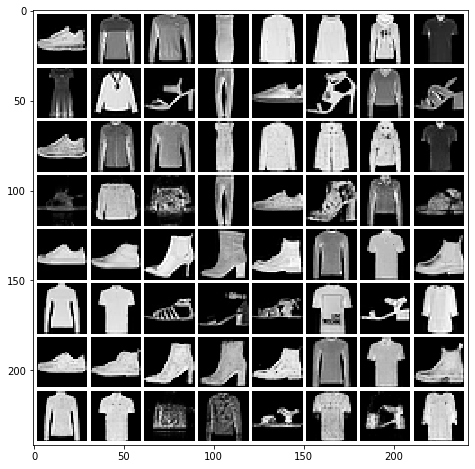

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025155475
Starting epoch 71


100%|██████████| 60000/60000 [00:34<00:00, 1717.14it/s, d_loss=0.0555, g_loss=76.3, mse=0.0223]


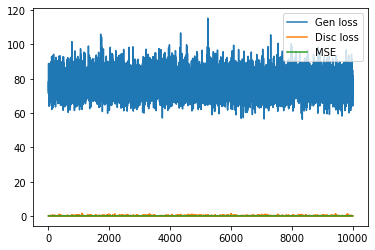

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


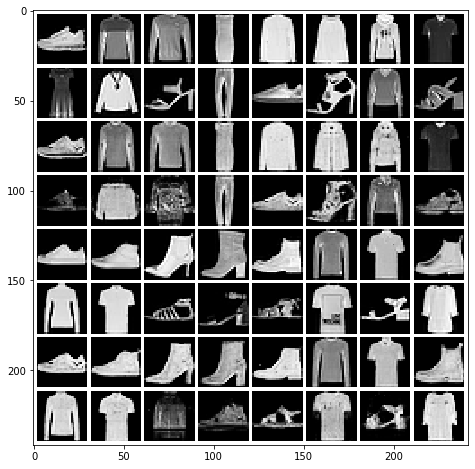

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025101138
Starting epoch 72


100%|██████████| 60000/60000 [00:34<00:00, 1745.62it/s, d_loss=0.0409, g_loss=77.7, mse=0.0228]


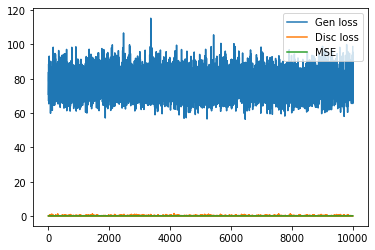

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


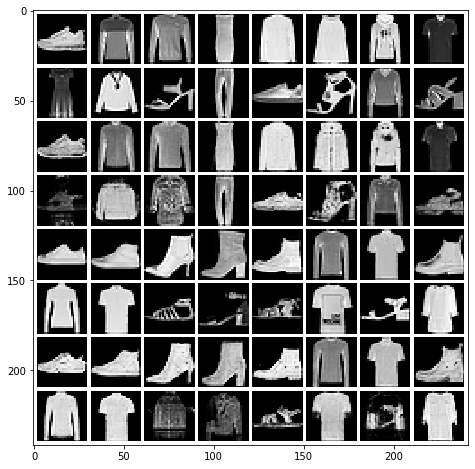

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025485441
Starting epoch 73


100%|██████████| 60000/60000 [00:34<00:00, 1722.74it/s, d_loss=0.0561, g_loss=76.3, mse=0.0221]


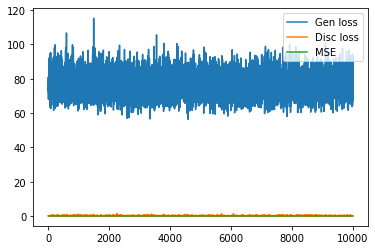

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


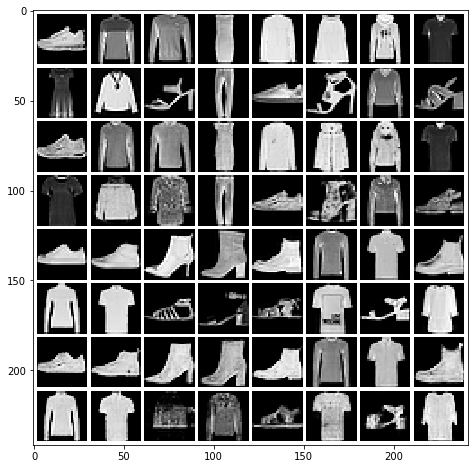

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024944084
Starting epoch 74


100%|██████████| 60000/60000 [00:35<00:00, 1713.16it/s, d_loss=0.0703, g_loss=76.4, mse=0.0222]


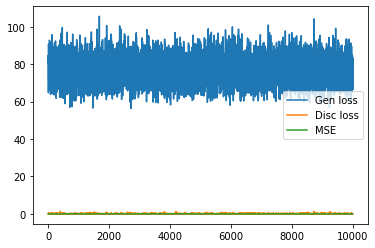

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


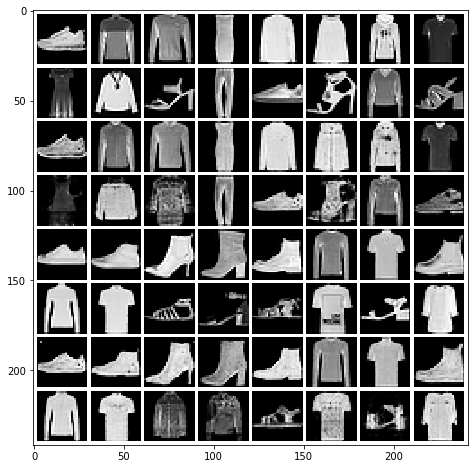

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.02487698
Starting epoch 75


100%|██████████| 60000/60000 [00:34<00:00, 1735.99it/s, d_loss=0.0529, g_loss=76.1, mse=0.0221]


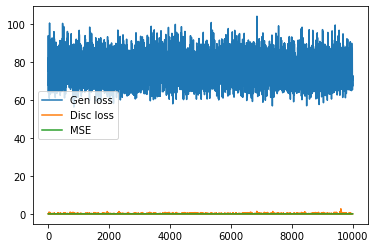

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


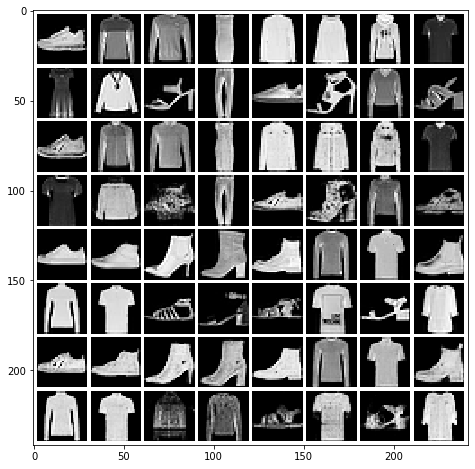

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025067804
Starting epoch 76


100%|██████████| 60000/60000 [00:34<00:00, 1719.54it/s, d_loss=0.0631, g_loss=76, mse=0.0221]  


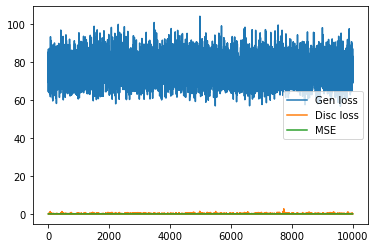

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


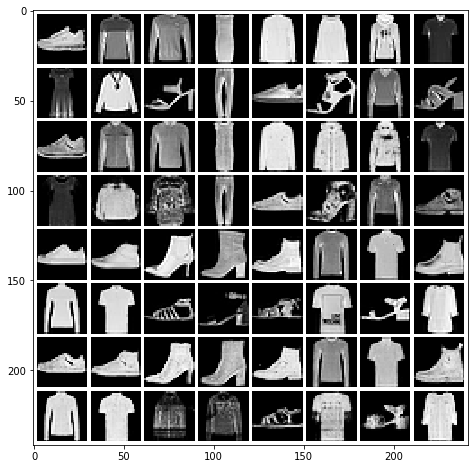

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024976829
Starting epoch 77


100%|██████████| 60000/60000 [00:34<00:00, 1833.96it/s, d_loss=0.0511, g_loss=74.7, mse=0.0214]


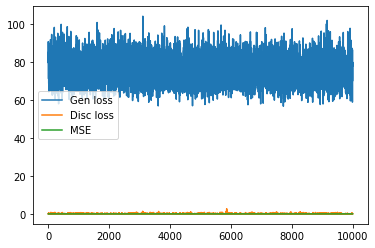

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


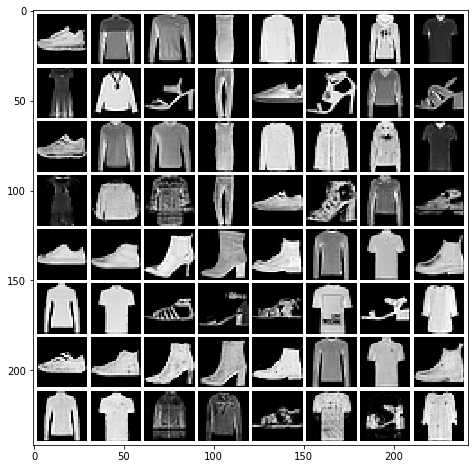

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025142001
Starting epoch 78


100%|██████████| 60000/60000 [00:35<00:00, 1707.41it/s, d_loss=0.0503, g_loss=75.6, mse=0.0221]


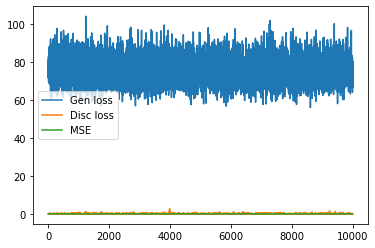

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


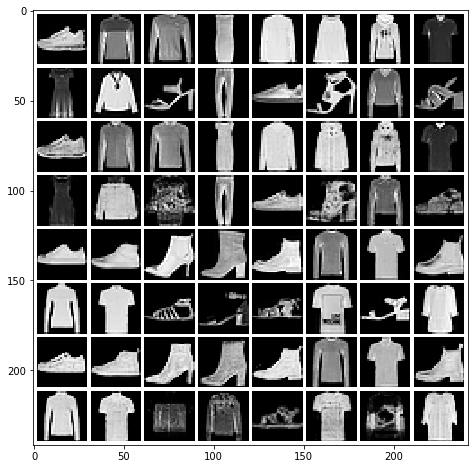

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024472948
Starting epoch 79


100%|██████████| 60000/60000 [00:35<00:00, 1709.40it/s, d_loss=0.0467, g_loss=76, mse=0.022]   


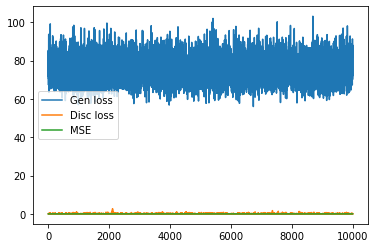

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


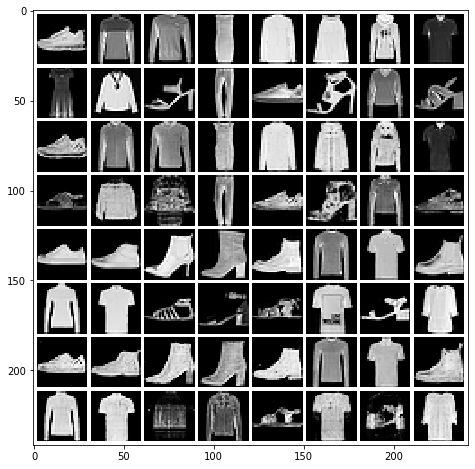

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025013026
Starting epoch 80


100%|██████████| 60000/60000 [00:34<00:00, 1724.65it/s, d_loss=0.1, g_loss=74.4, mse=0.0214]   


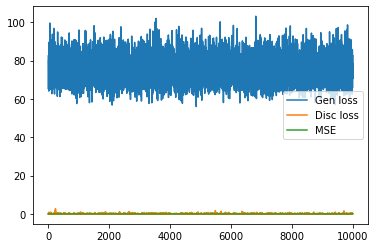

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


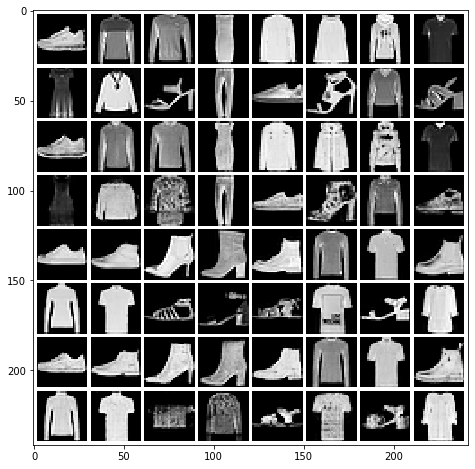

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025156263
Starting epoch 81


100%|██████████| 60000/60000 [00:34<00:00, 1737.54it/s, d_loss=0.0812, g_loss=75.2, mse=0.0217]


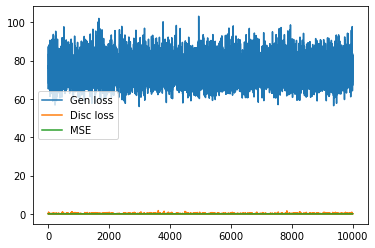

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


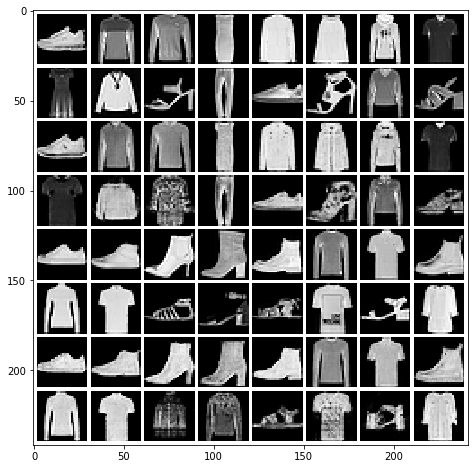

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024724776
Starting epoch 82


100%|██████████| 60000/60000 [00:34<00:00, 1725.54it/s, d_loss=0.0487, g_loss=75.3, mse=0.0217]


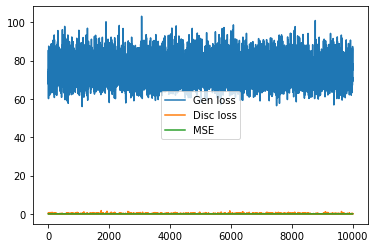

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


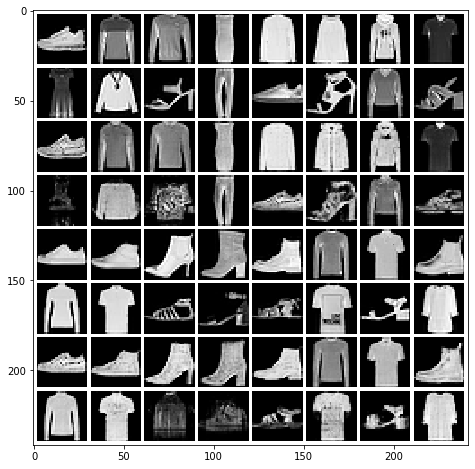

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024813948
Starting epoch 83


100%|██████████| 60000/60000 [00:34<00:00, 1723.62it/s, d_loss=0.0693, g_loss=75, mse=0.0214]  


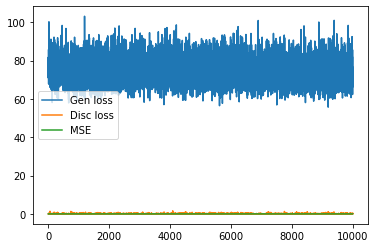

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


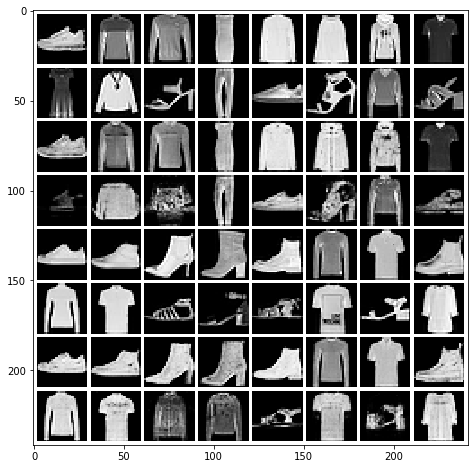

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025482563
Starting epoch 84


100%|██████████| 60000/60000 [00:34<00:00, 1741.07it/s, d_loss=0.066, g_loss=74.5, mse=0.0212] 


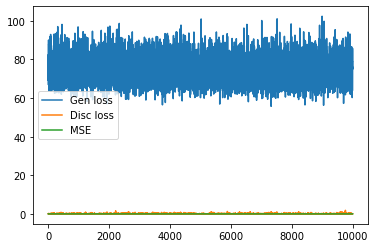

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


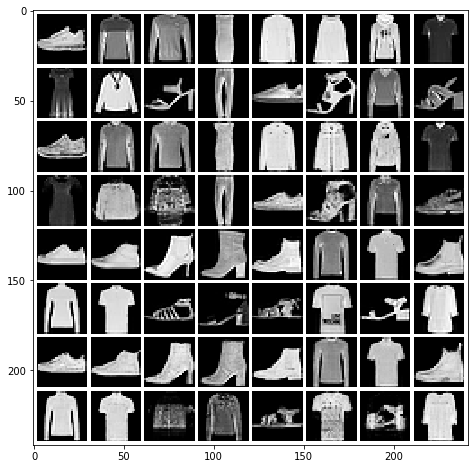

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024688795
Starting epoch 85


100%|██████████| 60000/60000 [00:35<00:00, 1708.86it/s, d_loss=0.0434, g_loss=75.9, mse=0.0217]


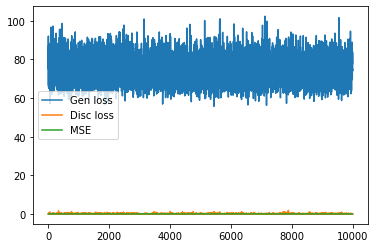

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


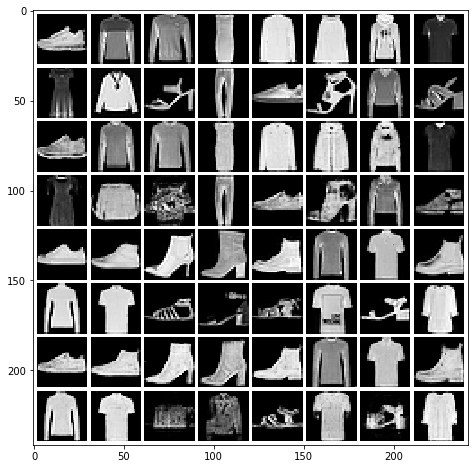

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024882326
Starting epoch 86


100%|██████████| 60000/60000 [00:34<00:00, 1712.80it/s, d_loss=0.0512, g_loss=75.1, mse=0.0215]


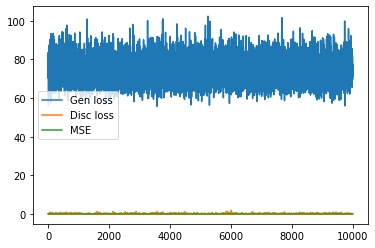

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


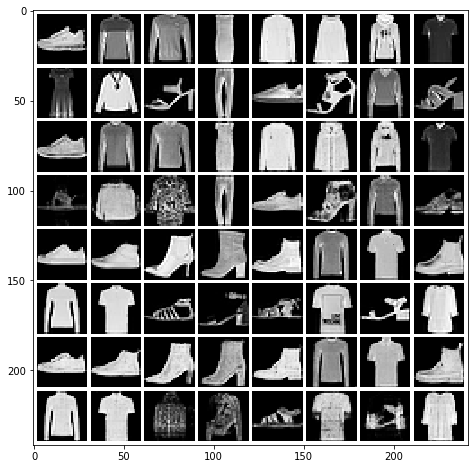

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024970295
Starting epoch 87


100%|██████████| 60000/60000 [00:35<00:00, 1700.02it/s, d_loss=0.0548, g_loss=74.1, mse=0.0211]


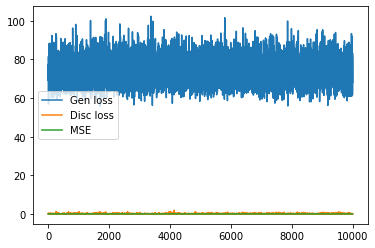

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


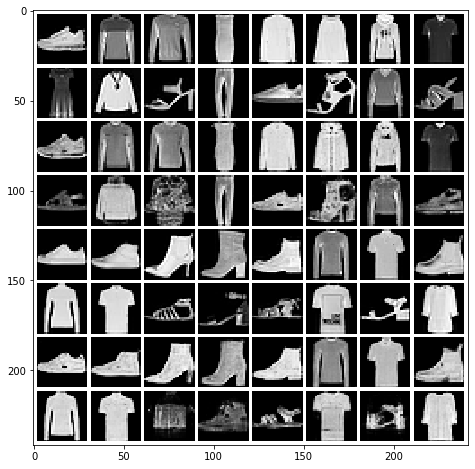

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024635937
Starting epoch 88


100%|██████████| 60000/60000 [00:35<00:00, 1698.73it/s, d_loss=0.055, g_loss=74.5, mse=0.021]  


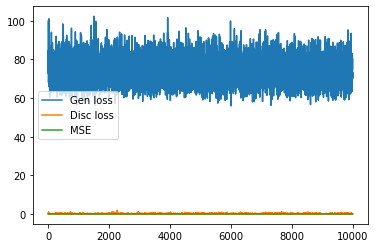

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


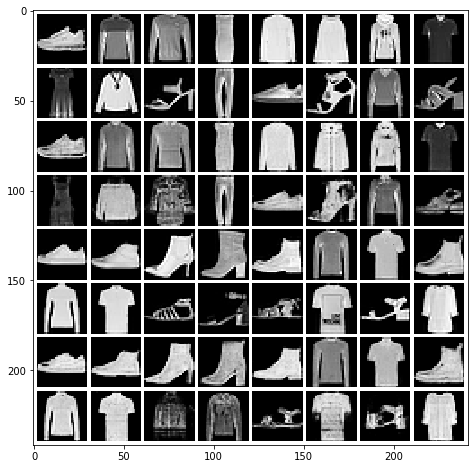

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024768664
Starting epoch 89


100%|██████████| 60000/60000 [00:34<00:00, 1719.78it/s, d_loss=0.0632, g_loss=74.2, mse=0.021] 


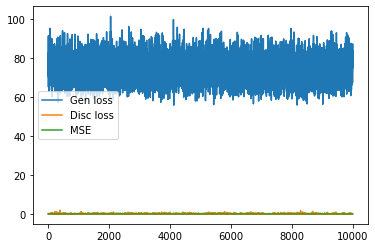

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


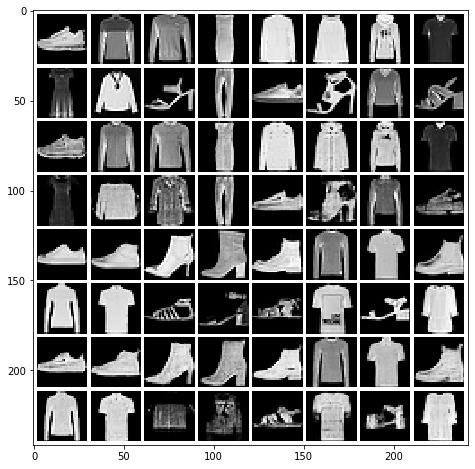

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024363717
Starting epoch 90


100%|██████████| 60000/60000 [00:34<00:00, 1730.22it/s, d_loss=0.0328, g_loss=74.6, mse=0.0211]


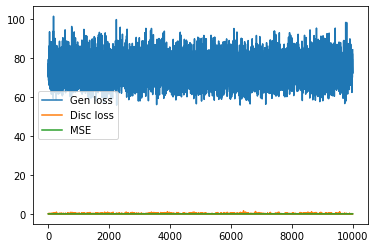

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


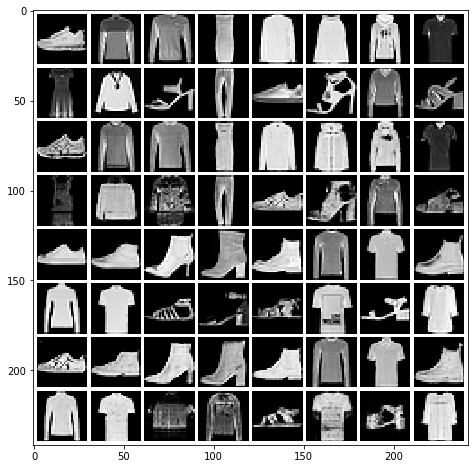

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025100706
Starting epoch 91


100%|██████████| 60000/60000 [00:34<00:00, 1732.75it/s, d_loss=0.0526, g_loss=73.7, mse=0.0211]


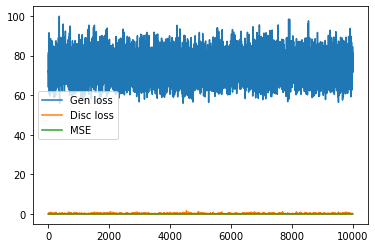

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


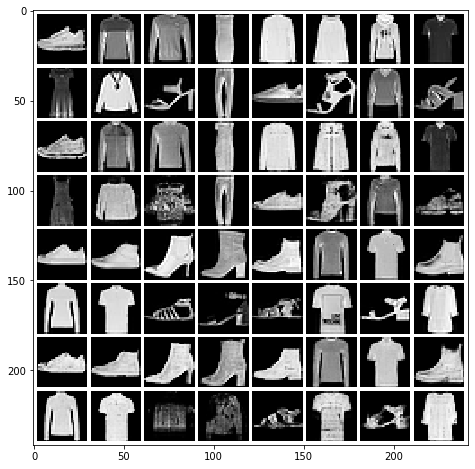

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024639793
Starting epoch 92


100%|██████████| 60000/60000 [00:34<00:00, 1725.31it/s, d_loss=0.0441, g_loss=73.6, mse=0.0209]


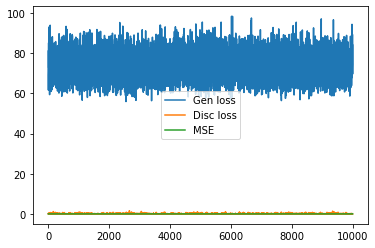

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


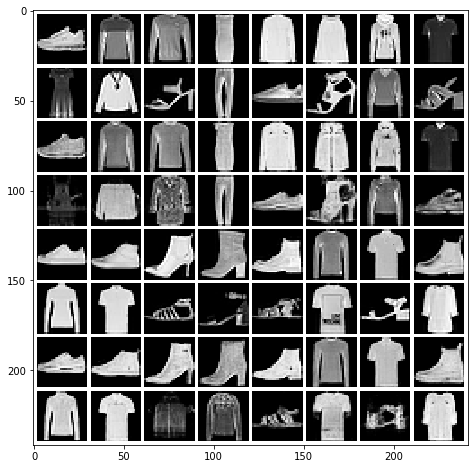

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024378287
Starting epoch 93


100%|██████████| 60000/60000 [00:35<00:00, 1702.66it/s, d_loss=0.055, g_loss=74.6, mse=0.0213] 


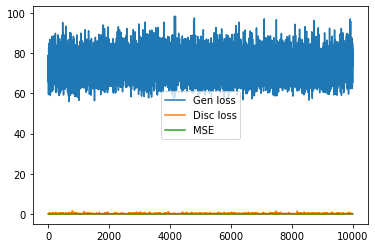

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


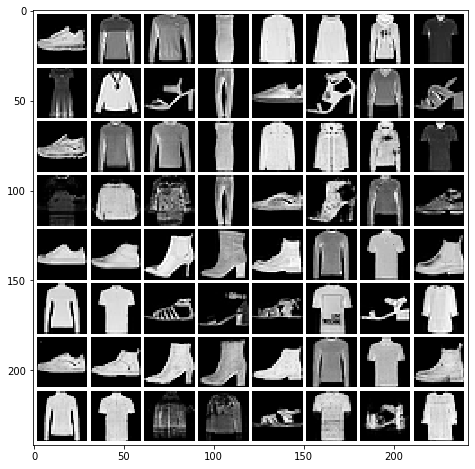

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024499021
Starting epoch 94


100%|██████████| 60000/60000 [00:34<00:00, 1728.43it/s, d_loss=0.075, g_loss=72.6, mse=0.0204] 


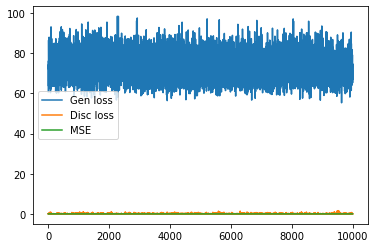

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


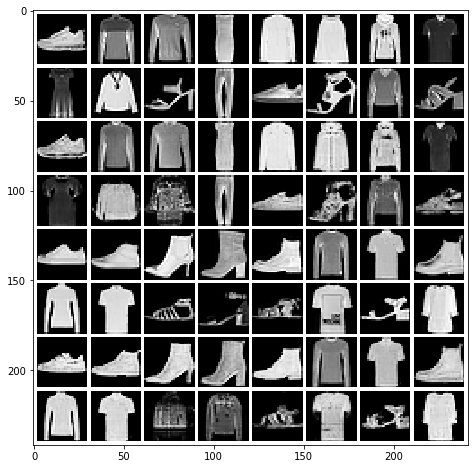

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024372997
Starting epoch 95


100%|██████████| 60000/60000 [00:34<00:00, 1744.89it/s, d_loss=0.0619, g_loss=73.1, mse=0.0205]


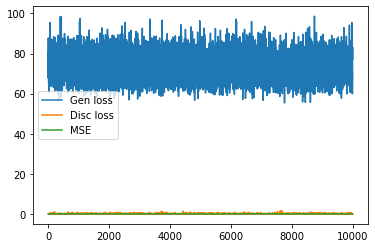

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


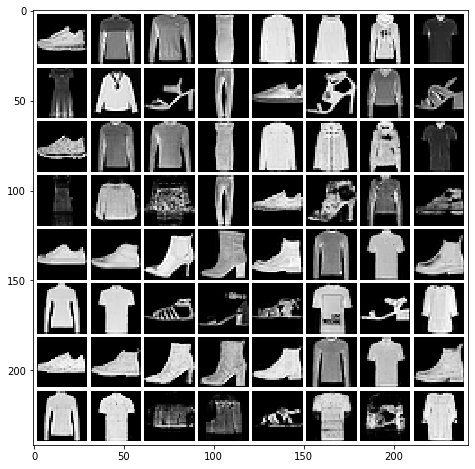

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024838269
Starting epoch 96


100%|██████████| 60000/60000 [00:35<00:00, 1704.51it/s, d_loss=0.0648, g_loss=73.1, mse=0.0204]


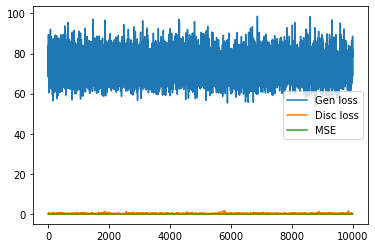

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


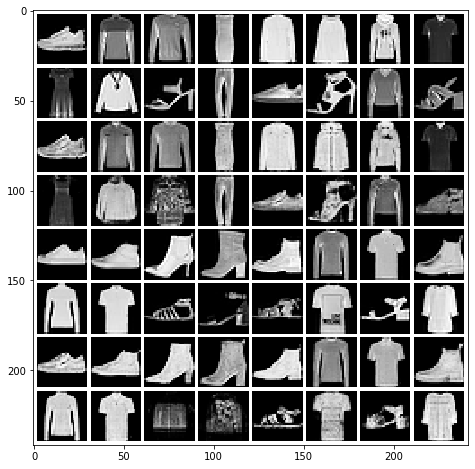

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024575805
Starting epoch 97


100%|██████████| 60000/60000 [00:35<00:00, 1704.76it/s, d_loss=0.0672, g_loss=72.3, mse=0.02]  


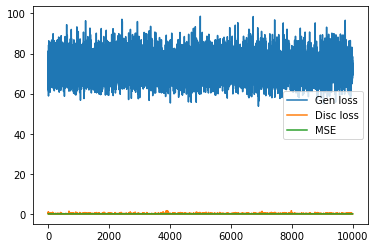

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


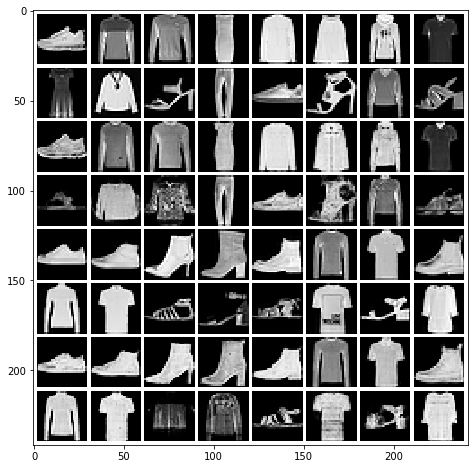

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024831844
Starting epoch 98


100%|██████████| 60000/60000 [00:34<00:00, 1744.20it/s, d_loss=0.067, g_loss=73.1, mse=0.0207] 


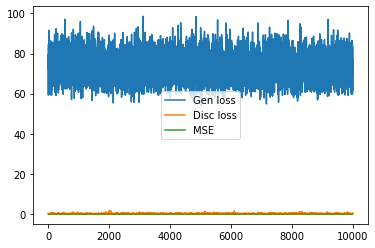

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


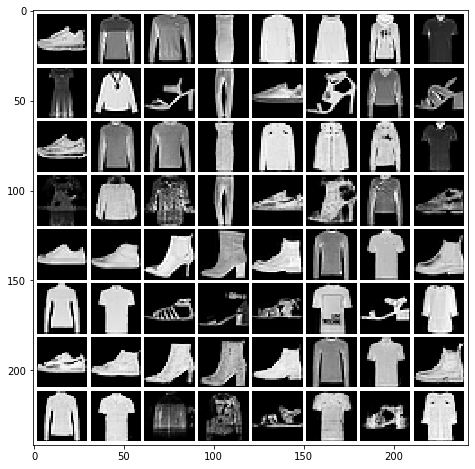

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.025111126
Starting epoch 99


100%|██████████| 60000/60000 [00:34<00:00, 1725.27it/s, d_loss=0.0391, g_loss=72.4, mse=0.0202]


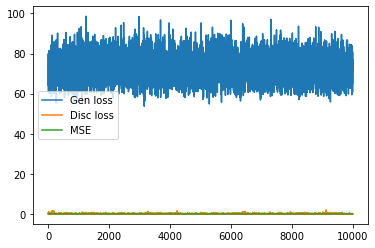

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


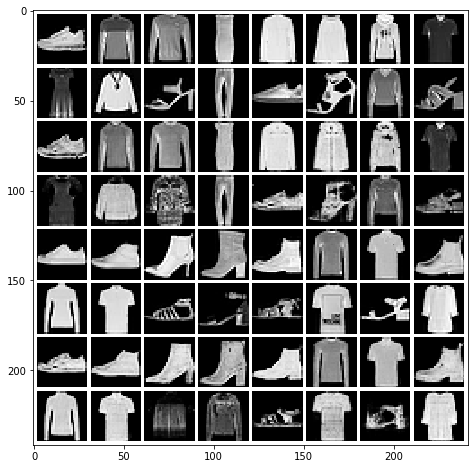

  0%|          | 0/60000 [00:00<?, ?it/s]

MSE validation: 0.024844378
Starting epoch 100


100%|██████████| 60000/60000 [00:35<00:00, 1708.02it/s, d_loss=0.0996, g_loss=73.1, mse=0.0206]


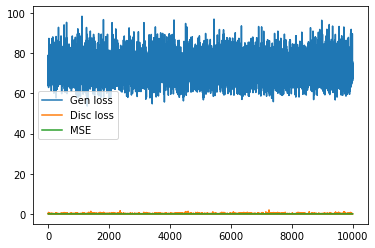

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


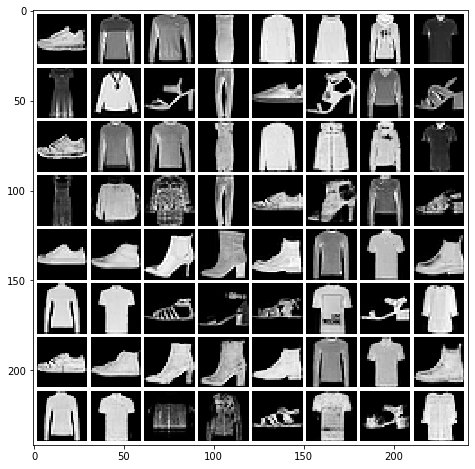

MSE validation: 0.02463244


In [107]:
### TRAIN MODEL ###

import time
num_epochs = 100

train_model(gen, disc, g_opt, d_opt, device, dataloader['train'], epochs=num_epochs)

gen_weights = gen.state_dict().copy()
disc_weights = disc.state_dict().copy()

torch.save(gen_weights, "../cache/cGAN/Ameas10FCGenerator2048Fashion_{0:04d}_{1}.sd".format(num_epochs, time.strftime("%Y%m%d_%H%M%S")))
torch.save(disc_weights, "../cache/cGAN/Ameas10ConvDiscriminator64Fashion_{0:04d}_{1}.sd".format(num_epochs, time.strftime("%Y%m%d_%H%M%S")))

In [42]:
### LOAD MODEL ####

m = 784

A = pickle.load(open("../cache/A/A{}.p".format(m), "rb")).to(device)
print(A.shape)

gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=2048)
#disc = models.FCDiscriminator(imsize=imsize, h=2048)
disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=64)

# TODO: map storage location to correct GPU!
gen.load_state_dict(torch.load("../cache/models/cGAN_Fashion/Ameas{}FCGenerator2048Fashion_0100.sd".format(m), map_location={'cuda:1': device.__str__()}));
#disc.load_state_dict(torch.load("../cache/cGAN/Ameas200ConvDiscriminator64Fashion_0100_20190927_002846.sd", map_location={'cuda:1': device.__str__()}));

torch.Size([784, 784])
Version 0.4


In [43]:
# Calculate test predictions #

test_images, test_outputs = test_generator(gen, device, dataloader['test'])
print(test_images.shape)

(8000, 1, 28, 28)


In [44]:
### CACHE RESULTS ###

import pickle
pickle.dump(test_images, open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas{}_cganrand_4_1024_original.p".format(m), "wb"))
pickle.dump(test_outputs, open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas{}_cganrand_4_1024.p".format(m), "wb"))

In [45]:
### LOAD RESULTS ###
import pickle

test_images = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas{}_cganrand_4_1024_original.p".format(m), "rb"))
test_outputs = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas{}_cganrand_4_1024.p".format(m), "rb"))

In [46]:
# Benchmark test predictions #

benchmark(pred=test_outputs[:1024], true=test_images[:1024], check_all=True)

Signal error:
  MSE: 0.011868325515365541, std: 0.010071926608660462
  MAE: 0.049706792574397696, std: 0.02443759586691456
  SSIM: 0.8070293623996238, std: 0.1308123169745411
  Sharpness: 0.07819193611978383, std: 0.03519713593000899
  PhCo-MSE: 0.013341425229896231, std: 0.016356791449834675
  PhCo-MAE: 0.05213039701720845, std: 0.031238028630260244
  PhCo-SSIM: 0.7964818228252711, std: 0.15299090664703366
  CroCo-MSE: 0.011845177804730156, std: 0.010035119575858776
  CroCo-MAE: 0.049695035789227404, std: 0.024415020728680834
  CroCo-SSIM: 0.8072819587241962, std: 0.13017696413363952

Magnitude error:
  MSE Magnitude: 3.578761259107864, std: 2.9599763881153724

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01187 | 0.04971 | 0.8070 | 0.07819 | 0.01334 | 0.05213 | 0.7965 | 0.01185 | 0.04970 | 0.8073 | 3.579 |


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


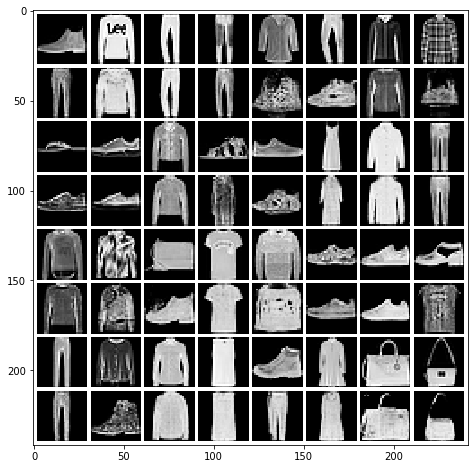

In [140]:
# Print test predictions 2 #

to_plot = np.stack([test_images[:32, 0].reshape(4, 8, 28, 28), 
                    test_outputs[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
                
plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/Ameas10_4_1024.png")

#plot_grid(torch.Tensor(np.stack([test_images[:32, 0].reshape(4, 8, 28, 28), test_outputs[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)),
#          file='/home/shared/phase-retrieval/out/cgan/'+dataset+'/cgan{0}.pdf'.format(time.strftime("%Y%m%d_%H%M%S")))

## Evaluation for different cGAN models (random z and 1024 samples)


| Nr Type | epochs | m | MSE | MAE | SSIM | FASI-MSE | FASI-MAE | COCO-MSE | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 4 | 100 | 784 | 0.01180 | 0.04961 | 0.8073 | 0.01262 | 0.05114 | 0.01177 | 3.569
| 4 | 100 | 500 | 0.01254 | 0.05145 | 0.7992 | 0.01340 | 0.05294 | 0.01252 | 3.755
| 4 | 100 | 300 | 0.01284 | 0.05192 | 0.7957 | 0.01368 | 0.01368 | 0.01280 | 3.861
| 4 | 100 | 200 | 0.01294 | 0.05255 | 0.7934 | 0.01368 | 0.05380 | 0.01291 | 3.989
| 4 | 100 | 100 | 0.01419 | 0.05554 | 0.7792 | 0.01485 | 0.05674 | 0.01414 | 4.356
| 4 | 100 | 50 | 0.01617 | 0.05988 | 0.7572 | 0.01736 | 0.06182 | 0.01601 | 4.958
| 4 | 100 | 25 | 0.02412 | 0.07471 | 0.6901 | 0.02618 | 0.07781 | 0.02334 | 7.552
| 4 | 100 | 10 | 0.05115 | 0.11748 | 0.5222 | 0.05493 | 0.1229 | 0.04554 | 16.836


In [111]:
# Latent z optimization

def genopt(sample_meas_pad, gen, device, steps=5000, lr=1.0):

    gen.to(device)
    gen.eval()

    z = torch.randn((sample_meas_pad.shape), requires_grad=True, device=device)    
    optimizer = optim.Adam([z], lr=lr)
    
    losses = []
    last_out = gen(torch.cat([z, sample_meas_pad], dim=1))
    
    for i in range(steps):
        _, meas_pad = calc_meas(last_out)

        mse_all = torch.mean((meas_pad - sample_meas_pad) ** 2, dim=(1, 2, 3))
        loss = torch.sum(mse_all)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        last_out = gen(torch.cat([z, sample_meas_pad], dim=1))
        
        losses.append(loss.item())
    
    return last_out.detach(), losses, mse_all

Batch 1/1 finished


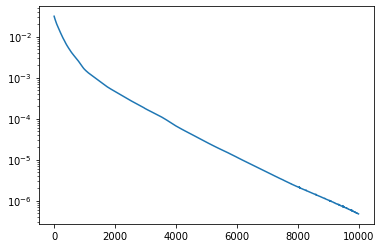

In [150]:
### Latent z optimization ###

num_batches = 32
batch_size = 32
steps = 10000
max_loss = 0.0
lr = 1e-3

###

out_original = np.zeros((batch_size * num_batches, *imsize))
out_results = np.zeros((batch_size * num_batches, *imsize))
mse_all = np.full((batch_size * num_batches), np.inf)

for batch_i, batch in enumerate(dataloader['test']):
    test_sample = batch.to(device)
    _, test_meas_pad = calc_meas(test_sample)   
    out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()
    

    cur_out_results, cur_loss, cur_mse_all = genopt(sample_meas_pad=test_meas_pad, gen=gen,
                                                    device=device, steps=steps, lr=lr)
    cur_out_results = cur_out_results.cpu().numpy()
    
    out_results[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_out_results
    mse_all[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_mse_all.detach().cpu().numpy()

    print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
    if batch_i + 1 >= num_batches:
        break

plt.semilogy(cur_loss)
plt.show()

In [ ]:
### CACHE RESULTS ###

import pickle
pickle.dump(out_original, open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas10_cgan_4_1024_original.p", "wb"))
pickle.dump(out_results, open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas10_cgan_4_1024.p", "wb"))

In [141]:
### LOAD RESULTS ###
import pickle

out_original = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas10_cgan_4_1024_original.p", "rb"))
out_results = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/Ameas10_cgan_4_1024.p", "rb"))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Output under minimized magnitude distance:


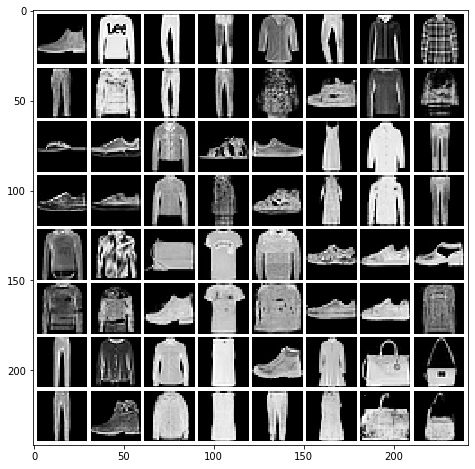

Signal error:
  MSE: 0.05970238001462048, std: 0.05590165567299062
  MAE: 0.12955561140446378, std: 0.08358337200885141
  SSIM: 0.4723857079569604, std: 0.28941936966740384
  FASI-MSE: 0.05570979677840851, std: 0.043491133972511614
  FASI-MAE: 0.126253147682209, std: 0.07171145017934477
  COCO-MSE: 0.05010970457967569, std: 0.03943649230936195

Magnitude error:
  MSE Magnitude: 20.03807489616926, std: 21.7268394480377

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]


In [144]:
print("Output under minimized magnitude distance:")
to_plot = torch.Tensor(np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                                 out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28))
plot_grid(to_plot, figsize=(8, 8), file="../out/cgan/fashion/Ameas10_4_1024_10000latentSteps.png")
#plot_grid(to_plot, figsize=(8, 8))

benchmark(pred=out_results, true=out_original, check_all=True)

## Final Evaluation (1024 samples)

lr adjusted for best minimizing error between measurements. lower for fewer measurements

| Nr Type | iterations | lr | m | MSE | MAE | SSIM | FASI-MSE | FASI-MAE | COCO-MSE | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 4 | 10000 | 1.0 | 784 | 0.003378 | 0.02774 | 0.9176 | 0.003378 | 0.02774 | 0.003378 | 1.289
| 4 | 10000 | 1.0 | 500 | 0.003694 | 0.02907 | 0.9120 | 0.003694 | 0.02907 | 0.003694 | 1.362
| 4 | 10000 | 1.0 | 300 | 0.004607 | 0.03225 | 0.8953 | 0.004637 | 0.03231 | 0.004604 | 1.596
| 4 | 10000 | 1.0 | 200 | 0.006520 | 0.03799 | 0.8659 | 0.006505 | 0.03801 | 0.006444 | 2.098
| 4 | 10000 | 1e-1 | 100 | 0.01086 | 0.05019 | 0.8032 | 0.01113 | 0.05072 | 0.01084 | 3.328
| 4 | 10000 | 1e-1 | 50 | 0.01616 | 0.06187 | 0.7458 | 0.01708 | 0.06339 | 0.01603 | 4.799
| 4 | 10000 | 1e-2 | 25 | 0.02479 | 0.07740 | 0.6769 | 0.02702 | 0.08074 | 0.02395 | 7.669
| 4 | 10000 | 1e-3 | 10 | 0.05033 | 0.1179 | 0.5215 | 0.0535 | 0.1228 | 0.04461 | 16.712


## Raw output

### Random z

m=784:

Signal error:
  MSE: 0.011804655613445902, std: 0.010024305987676514
  MAE: 0.04961016513698269, std: 0.024551942522358115
  SSIM: 0.8072647402199808, std: 0.13049520252322946
  FASI-MSE: 0.012622800024814751, std: 0.011858902783980205
  FASI-MAE: 0.051144559647582355, std: 0.027457054906059736
  COCO-MSE: 0.011770710287979939, std: 0.009976848346438133

Magnitude error:
  MSE Magnitude: 3.5692994912125053, std: 2.984299044681337


m=500:

Signal error:
  MSE: 0.012545394839207802, std: 0.010619638435409483
  MAE: 0.05145060431641468, std: 0.025379079901935536
  SSIM: 0.7991500141241066, std: 0.1345184518208275
  FASI-MSE: 0.013398930612993354, std: 0.013176236073656741
  FASI-MAE: 0.05294323260750389, std: 0.028556809594868143
  COCO-MSE: 0.012515020479180447, std: 0.010561682356830662

Magnitude error:
  MSE Magnitude: 3.755424533583239, std: 3.075621920392672



m=300:

Signal error:
  MSE: 0.01284445579074145, std: 0.011024196902340497
  MAE: 0.051918744642534875, std: 0.026087041456294674
  SSIM: 0.7956668752970654, std: 0.13563313455722242
  FASI-MSE: 0.013675663344542954, std: 0.01375688638383745
  FASI-MAE: 0.05329042968151043, std: 0.02938658871479696
  COCO-MSE: 0.012796371442620746, std: 0.01091836935032381

Magnitude error:
  MSE Magnitude: 3.8607067868179747, std: 3.26186377465982


m=200:

Signal error:
  MSE: 0.012936862392734838, std: 0.011048167334937164
  MAE: 0.05255307686547894, std: 0.026333272558586363
  SSIM: 0.7934385095153575, std: 0.1385769858344765
  FASI-MSE: 0.013676669464302904, std: 0.012798020356474095
  FASI-MAE: 0.05379993883343559, std: 0.028679821786684594
  COCO-MSE: 0.012908446158612204, std: 0.011018099871654006

Magnitude error:
  MSE Magnitude: 3.9888516730923884, std: 3.409986135650644


m=100:

Signal error:
  MSE: 0.014191999030799707, std: 0.012497159035274432
  MAE: 0.05554015161396819, std: 0.028330100414064762
  SSIM: 0.7791582125861782, std: 0.14850848952416948
  FASI-MSE: 0.01484851646387142, std: 0.013878995588701112
  FASI-MAE: 0.05674080381504609, std: 0.03027605417916497
  COCO-MSE: 0.01413676169112872, std: 0.012411476024797235

Magnitude error:
  MSE Magnitude: 4.355682599839001, std: 3.815350535881727


m=50:

Signal error:
  MSE: 0.016168396238981586, std: 0.013906401922123139
  MAE: 0.05987816919969191, std: 0.031604774398586194
  SSIM: 0.7571522096318637, std: 0.1646857082979827
  FASI-MSE: 0.017361406067948337, std: 0.016932411253042
  FASI-MAE: 0.06181990599452547, std: 0.03559476091225995
  COCO-MSE: 0.01601018061642446, std: 0.013623093757055272

Magnitude error:
  MSE Magnitude: 4.958372842526887, std: 4.283377010301038


m=25:

Signal error:
  MSE: 0.024119329397763067, std: 0.02183949224225527
  MAE: 0.07471018864271173, std: 0.04173387282253488
  SSIM: 0.6901226551007533, std: 0.20444695770596344
  FASI-MSE: 0.026184939883478364, std: 0.028088082022625832
  FASI-MAE: 0.07781490363231569, std: 0.04786759248374536
  COCO-MSE: 0.02333763588546836, std: 0.020304812397684682

Magnitude error:
  MSE Magnitude: 7.552700568540855, std: 7.246115373136682


m=10:

Signal error:
  MSE: 0.05115289077389207, std: 0.04427717293488757
  MAE: 0.11747838394330756, std: 0.06617677705795678
  SSIM: 0.5222399580128625, std: 0.25687542103416594
  FASI-MSE: 0.05493081268173228, std: 0.050794320763334205
  FASI-MAE: 0.12290935570854344, std: 0.07412650837022997
  COCO-MSE: 0.0455370186563297, std: 0.035748357744552234

Magnitude error:
  MSE Magnitude: 16.835859256108456, std: 17.407594297952198


### Optimal z

m=784:

Signal error:
  MSE: 0.0033778390034656354, std: 0.004118513717525894
  MAE: 0.027741788294354613, std: 0.017570907754213
  SSIM: 0.9176009631440706, std: 0.07551189834124908
  FASI-MSE: 0.0033778390034656354, std: 0.004118513717525894
  FASI-MAE: 0.027741788294354613, std: 0.017570907754213
  COCO-MSE: 0.003377839003465665, std: 0.004118513717525891

Magnitude error:
  MSE Magnitude: 1.2893843685278745, std: 1.645054133398532


m=500:

Signal error:
  MSE: 0.0036940066672008325, std: 0.004708474140653809
  MAE: 0.029073663352746, std: 0.019021158301263944
  SSIM: 0.9120066275478607, std: 0.08350761634114173
  FASI-MSE: 0.0036940066672008325, std: 0.004708474140653809
  FASI-MAE: 0.029073663352746, std: 0.019021158301263944
  COCO-MSE: 0.003694006667200867, std: 0.004708474140653804

Magnitude error:
  MSE Magnitude: 1.3622851110403364, std: 1.767256130428009


m=300:

Signal error:
  MSE: 0.004607141954420103, std: 0.00620389005982624
  MAE: 0.032247151473710066, std: 0.021835463139507662
  SSIM: 0.8952854631384777, std: 0.10513537503173541
  FASI-MSE: 0.004636922764083213, std: 0.006364778529011399
  FASI-MAE: 0.03230682482399135, std: 0.022040282962864748
  COCO-MSE: 0.004604363044671137, std: 0.0061941121365762

Magnitude error:
  MSE Magnitude: 1.5956714041171822, std: 2.1027763306102476


m=200:

Signal error:
  MSE: 0.006519649677744602, std: 0.009611619601882747
  MAE: 0.037991290480282616, std: 0.026362192576798997
  SSIM: 0.8659022152027414, std: 0.1291523444996403
  FASI-MSE: 0.0065046815328774835, std: 0.009389042618924752
  FASI-MAE: 0.03800667837961044, std: 0.026401122519064617
  COCO-MSE: 0.006443843083810823, std: 0.009057151169439372

Magnitude error:
  MSE Magnitude: 2.098306196037433, std: 2.8245680124484016


m=100:

Signal error:
  MSE: 0.010856375176598116, std: 0.012246831138149186
  MAE: 0.05019053208089748, std: 0.030640358334173178
  SSIM: 0.8032457508370865, std: 0.1515137576060763
  FASI-MSE: 0.011129718703359244, std: 0.012965543353042487
  FASI-MAE: 0.05072018726072312, std: 0.03179241275582
  COCO-MSE: 0.010840387827323739, std: 0.012213123452691519

Magnitude error:
  MSE Magnitude: 3.3284220250871743, std: 3.5939739147189624


m=50:

Signal error:
  MSE: 0.01616407459417708, std: 0.015564567822918133
  MAE: 0.061873089619564996, std: 0.034815705121069865
  SSIM: 0.7457515205139049, std: 0.17169687133289166
  FASI-MSE: 0.017084973930045374, std: 0.018151341233126454
  FASI-MAE: 0.06338874196240366, std: 0.03826080465443708
  COCO-MSE: 0.016034685914945074, std: 0.015201009229602451

Magnitude error:
  MSE Magnitude: 4.798637443384669, std: 4.433282707101995


m=25:

Signal error:
  MSE: 0.024791097911695342, std: 0.023781834751182722
  MAE: 0.07740482128056875, std: 0.0446201055449961
  SSIM: 0.6769396907253831, std: 0.20671650046314263
  FASI-MSE: 0.027015670160687212, std: 0.028515963892035007
  FASI-MAE: 0.080740988781567, std: 0.050283791400581805
  COCO-MSE: 0.023947655865111057, std: 0.021926552467964544

Magnitude error:
  MSE Magnitude: 7.669366405783693, std: 7.9285559369021925


m=10:

Signal error:
  MSE: 0.05033135843330365, std: 0.0448532603321977
  MAE: 0.1178510121237411, std: 0.06746484646796988
  SSIM: 0.5215252077491965, std: 0.25671714386749506
  FASI-MSE: 0.05352072243584144, std: 0.04879252221474533
  FASI-MAE: 0.12277668271155892, std: 0.07304828101047445
  COCO-MSE: 0.04460946146170634, std: 0.03596645680931703

Magnitude error:
  MSE Magnitude: 16.7119183224844, std: 17.336903432507725
